#EDA + ARIMA

 Temperature Dataset

# Import Package

In [190]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import pandas as pd
import dateutil.easter as ea
from statsmodels.tsa.seasonal import MSTL
from sklearn.cross_decomposition import CCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error

In [191]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [192]:
data_temp_nsw = pd.read_csv('/content/drive/MyDrive/NSW/temperature_nsw.csv')
data_temp_nsw['DATETIME'] = pd.to_datetime(data_temp_nsw['DATETIME'])
data_temp_nsw.tail()

,LOCATION,DATETIME,TEMPERATURE
220321,Bankstown,2021-03-17 23:00:00,19.1
220322,Bankstown,2021-03-17 23:20:00,19.0
220323,Bankstown,2021-03-17 23:30:00,18.8
220324,Bankstown,2021-03-17 23:34:00,18.8
220325,Bankstown,2021-03-18 00:00:00,18.6



### Data Preprocessing
#### Checking for Missing Values


In [193]:
miss_value = data_temp_nsw.isnull().sum()
print(miss_value)

LOCATION       0
DATETIME       0
TEMPERATURE    0
dtype: int64



It can be seen that in the temperature dataset there are no missing values from each column
#### Checking Data Duplication and Abnormal Data
The data was checked because this data was obtained once every 30 minutes every day. Therefore, if there is data whose timestamp is not a multiple of 30 minutes, the data row will be deleted and a duplicate check will also be carried out on this.


In [194]:
import pandas as pd

Convert DATETIME column to datetime type

In [195]:
data_temp_nsw['DATETIME'] = pd.to_datetime(data_temp_nsw['DATETIME'], format='%d/%m/%Y %H:%M')

Calculate the time difference between data entries

In [196]:
data_temp_nsw['TIME_DIFF'] = data_temp_nsw['DATETIME'].diff().dt.total_seconds()

Determine the threshold for the time difference that is considered abnormal

In [197]:
threshold = 1800  # 1800 seconds = 30 minutes

Check if the time difference exceeds the threshold or is not a multiple of 30 minutes

In [198]:
abnormal_indices = data_temp_nsw[(data_temp_nsw['TIME_DIFF'] != threshold) | (data_temp_nsw['DATETIME'].dt.minute % 30 != 0)].index

Update timestamp values and abnormal temperature values

In [199]:
for idx in abnormal_indices:
    if idx > 0 and data_temp_nsw.loc[idx, 'DATETIME'].minute % 30 != 0:
        prev_timestamp = data_temp_nsw.loc[idx-1, 'DATETIME']  # Previous timestamp
        prev_temperature = data_temp_nsw.loc[idx-1, 'TEMPERATURE']  # Previous temperature value
        data_temp_nsw.loc[idx, 'DATETIME'] = prev_timestamp
        data_temp_nsw.loc[idx, 'TEMPERATURE'] = prev_temperature

Delete the TIME_DIFF column because it is no longer needed

In [200]:
data_temp_nsw = data_temp_nsw.drop(columns=['TIME_DIFF'])

Remove duplicate data based on LOCATION, DATETIME, and TEMPERATURE columns

In [201]:
temp_clean = data_temp_nsw.drop_duplicates(subset=['LOCATION', 'DATETIME', 'TEMPERATURE'])
temp_clean.tail()

,LOCATION,DATETIME,TEMPERATURE
220319,Bankstown,2021-03-17 22:00:00,19.7
220320,Bankstown,2021-03-17 22:30:00,19.5
220321,Bankstown,2021-03-17 23:00:00,19.1
220323,Bankstown,2021-03-17 23:30:00,18.8
220325,Bankstown,2021-03-18 00:00:00,18.6


Checking the amount of data before and after deleting duplicate data

Data Before Deletion

In [202]:
print("Data Before Deletion:", len(data_temp_nsw))

Data Before Deletion: 220326


Data After Deleting

In [203]:
print("Data After Deleting:", len(temp_clean))

Data After Deleting: 195934



It can be seen from the comparison results above that 24,392 rows of data have been deleted due to the possibility of human error and data duplication.
### Descriptive statistics


In [204]:
stat_desk_temp = data_temp_nsw.describe()
stat_desk2_temp = temp_clean.describe()
combined_desk = pd.concat([stat_desk_temp, stat_desk2_temp], axis=1)
combined_desk.columns = ['Before Preprocessing', "After Preprocessing"]
print(combined_desk)

       Before Preprocessing  After Preprocessing
count         220326.000000        195934.000000
mean              17.428332            17.530868
std                5.856431             5.884349
min               -1.300000            -1.300000
25%               13.400000            13.500000
50%               17.700000            17.900000
75%               21.400000            21.500000
max               44.700000            44.700000



The descriptive statistical results above were obtained, which were divided into before preprocessing and after preprocessing. The striking difference between before and after preprocessing is the amount of data, where before preprocessing it was 220,326 and after preprocessing it was only 195,934 where around 24,392 rows of data were deleted. Apart from that, the average temperature data before preprocessing was 17.42 and after preprocessing it was 17.53. The minimum and maximum values before and after preprocessing remain the same, namely -1.3 and 44.7.
### Data Visualization


Box plot of temperature data

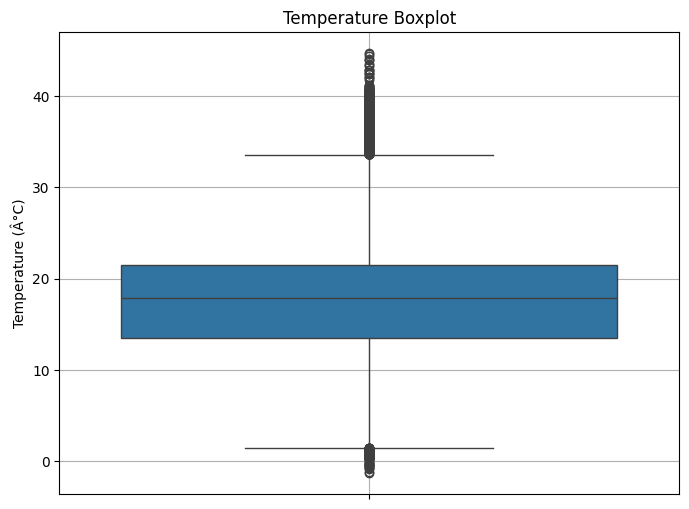

In [205]:
plt.figure(figsize=(8, 6))
sns.boxplot(y='TEMPERATURE', data=temp_clean)
plt.ylabel('Temperature (Â°C)')
plt.title('Temperature Boxplot')
plt.grid(True)
plt.show()

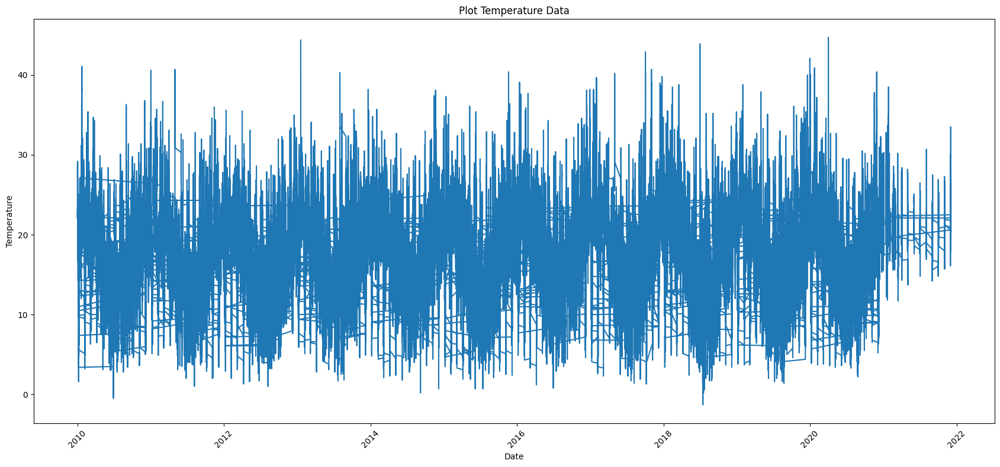

In [206]:
plt.figure(figsize=(17, 8))
plt.plot(temp_clean['DATETIME'], temp_clean['TEMPERATURE'])#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Plot Temperature Data')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()


Obtained above, plot the temperature data from January 2010 to December 2021 in the form of data per half hour. Visually, it looks like there is seasonality in the data, where fluctuations tend to recur in each period. Next, to make it clearer, a plot is made over an annual period.
#### 2010 Temperature Plot


Convert DATETIME column to datetime type

In [207]:
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')

<ipython-input-207-af5b2893390f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


Data filter only for January 2010

In [208]:
data_2010 = temp_clean[(temp_clean['DATETIME'].dt.year == 2010)]
data_2010 = data_2010.sort_values(by='DATETIME')

Time series plots

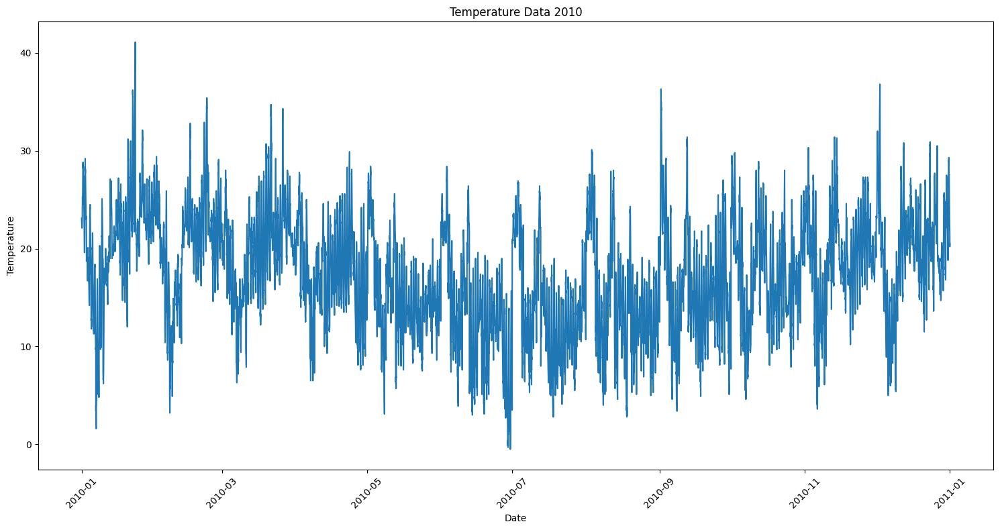

In [209]:
plt.figure(figsize=(15, 8))
plt.plot(data_2010['DATETIME'], data_2010['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2010')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

In [210]:
import matplotlib.pyplot as plt
import pandas as pd

Data filter only for 2010

In [211]:
data_2010 = temp_clean[temp_clean['DATETIME'].dt.year == 2010]

Separate data by month

In [212]:
january_data = data_2010[data_2010['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2010[data_2010['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2010[data_2010['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2010[data_2010['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2010[data_2010['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2010[data_2010['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2010[data_2010['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2010[data_2010['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2010[data_2010['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2010[data_2010['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2010[data_2010['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2010[data_2010['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

Create manual subplots

In [213]:
plt.figure(figsize=(20, 8))

<Figure size 2000x800 with 0 Axes>

<Figure size 2000x800 with 0 Axes>

Plot January data

(array([14610., 14614., 14618., 14622., 14626., 14630., 14634., 14638.,
        14641.]),
 [Text(14610.0, 0, '2010-01-01'),
  Text(14614.0, 0, '2010-01-05'),
  Text(14618.0, 0, '2010-01-09'),
  Text(14622.0, 0, '2010-01-13'),
  Text(14626.0, 0, '2010-01-17'),
  Text(14630.0, 0, '2010-01-21'),
  Text(14634.0, 0, '2010-01-25'),
  Text(14638.0, 0, '2010-01-29'),
  Text(14641.0, 0, '2010-02-01')])

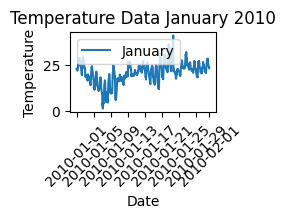

In [214]:
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2010')
plt.legend()
plt.xticks(rotation=45)

Plot February data

(array([14641., 14645., 14649., 14653., 14657., 14661., 14665., 14669.]),
 [Text(14641.0, 0, '2010-02-01'),
  Text(14645.0, 0, '2010-02-05'),
  Text(14649.0, 0, '2010-02-09'),
  Text(14653.0, 0, '2010-02-13'),
  Text(14657.0, 0, '2010-02-17'),
  Text(14661.0, 0, '2010-02-21'),
  Text(14665.0, 0, '2010-02-25'),
  Text(14669.0, 0, '2010-03-01')])

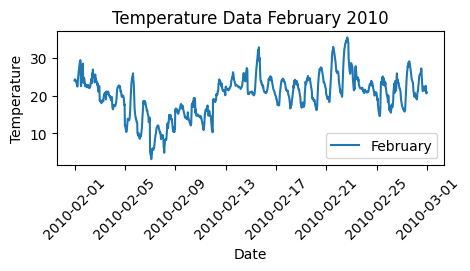

In [215]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2010')
plt.legend()
plt.xticks(rotation=45)

plot March data

(array([14669., 14673., 14677., 14681., 14685., 14689., 14693., 14697.,
        14700.]),
 [Text(14669.0, 0, '2010-03-01'),
  Text(14673.0, 0, '2010-03-05'),
  Text(14677.0, 0, '2010-03-09'),
  Text(14681.0, 0, '2010-03-13'),
  Text(14685.0, 0, '2010-03-17'),
  Text(14689.0, 0, '2010-03-21'),
  Text(14693.0, 0, '2010-03-25'),
  Text(14697.0, 0, '2010-03-29'),
  Text(14700.0, 0, '2010-04-01')])

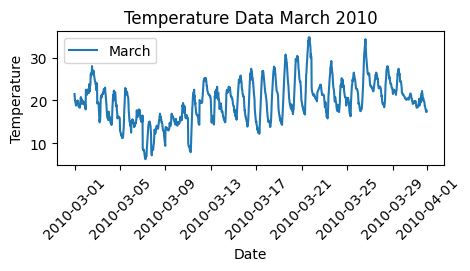

In [216]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2010')
plt.legend()
plt.xticks(rotation=45)

Plot April data

(array([14700., 14704., 14708., 14712., 14716., 14720., 14724., 14728.,
        14730.]),
 [Text(14700.0, 0, '2010-04-01'),
  Text(14704.0, 0, '2010-04-05'),
  Text(14708.0, 0, '2010-04-09'),
  Text(14712.0, 0, '2010-04-13'),
  Text(14716.0, 0, '2010-04-17'),
  Text(14720.0, 0, '2010-04-21'),
  Text(14724.0, 0, '2010-04-25'),
  Text(14728.0, 0, '2010-04-29'),
  Text(14730.0, 0, '2010-05-01')])

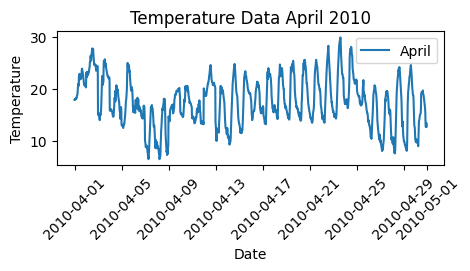

In [217]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2010')
plt.legend()
plt.xticks(rotation=45)

Plot May data

(array([14730., 14734., 14738., 14742., 14746., 14750., 14754., 14758.,
        14761.]),
 [Text(14730.0, 0, '2010-05-01'),
  Text(14734.0, 0, '2010-05-05'),
  Text(14738.0, 0, '2010-05-09'),
  Text(14742.0, 0, '2010-05-13'),
  Text(14746.0, 0, '2010-05-17'),
  Text(14750.0, 0, '2010-05-21'),
  Text(14754.0, 0, '2010-05-25'),
  Text(14758.0, 0, '2010-05-29'),
  Text(14761.0, 0, '2010-06-01')])

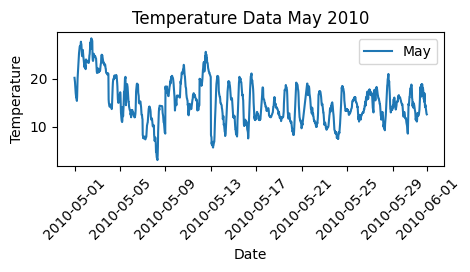

In [218]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2010')
plt.legend()
plt.xticks(rotation=45)

Plot June data

(array([14761., 14765., 14769., 14773., 14777., 14781., 14785., 14789.,
        14791.]),
 [Text(14761.0, 0, '2010-06-01'),
  Text(14765.0, 0, '2010-06-05'),
  Text(14769.0, 0, '2010-06-09'),
  Text(14773.0, 0, '2010-06-13'),
  Text(14777.0, 0, '2010-06-17'),
  Text(14781.0, 0, '2010-06-21'),
  Text(14785.0, 0, '2010-06-25'),
  Text(14789.0, 0, '2010-06-29'),
  Text(14791.0, 0, '2010-07-01')])

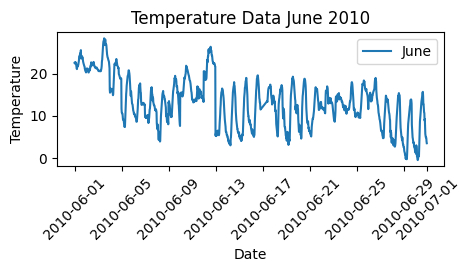

In [219]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2010')
plt.legend()
plt.xticks(rotation=45)

Plot data July

(array([14791., 14795., 14799., 14803., 14807., 14811., 14815., 14819.,
        14822.]),
 [Text(14791.0, 0, '2010-07-01'),
  Text(14795.0, 0, '2010-07-05'),
  Text(14799.0, 0, '2010-07-09'),
  Text(14803.0, 0, '2010-07-13'),
  Text(14807.0, 0, '2010-07-17'),
  Text(14811.0, 0, '2010-07-21'),
  Text(14815.0, 0, '2010-07-25'),
  Text(14819.0, 0, '2010-07-29'),
  Text(14822.0, 0, '2010-08-01')])

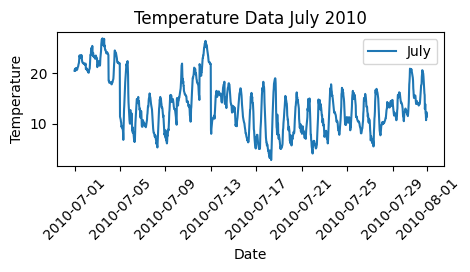

In [220]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2010')
plt.legend()
plt.xticks(rotation=45)

Plot data August

(array([14822., 14826., 14830., 14834., 14838., 14842., 14846., 14850.,
        14853.]),
 [Text(14822.0, 0, '2010-08-01'),
  Text(14826.0, 0, '2010-08-05'),
  Text(14830.0, 0, '2010-08-09'),
  Text(14834.0, 0, '2010-08-13'),
  Text(14838.0, 0, '2010-08-17'),
  Text(14842.0, 0, '2010-08-21'),
  Text(14846.0, 0, '2010-08-25'),
  Text(14850.0, 0, '2010-08-29'),
  Text(14853.0, 0, '2010-09-01')])

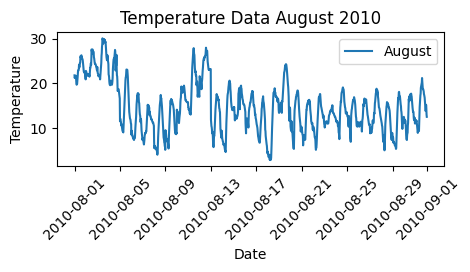

In [221]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2010')
plt.legend()
plt.xticks(rotation=45)

Plot data September

(array([14853., 14857., 14861., 14865., 14869., 14873., 14877., 14881.,
        14883.]),
 [Text(14853.0, 0, '2010-09-01'),
  Text(14857.0, 0, '2010-09-05'),
  Text(14861.0, 0, '2010-09-09'),
  Text(14865.0, 0, '2010-09-13'),
  Text(14869.0, 0, '2010-09-17'),
  Text(14873.0, 0, '2010-09-21'),
  Text(14877.0, 0, '2010-09-25'),
  Text(14881.0, 0, '2010-09-29'),
  Text(14883.0, 0, '2010-10-01')])

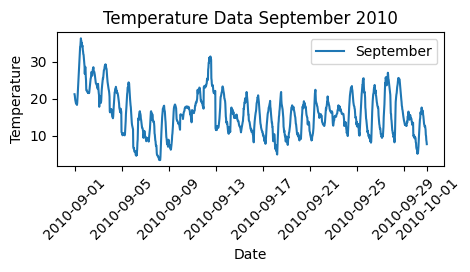

In [222]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2010')
plt.legend()
plt.xticks(rotation=45)

Plot data October

(array([14883., 14887., 14891., 14895., 14899., 14903., 14907., 14911.,
        14914.]),
 [Text(14883.0, 0, '2010-10-01'),
  Text(14887.0, 0, '2010-10-05'),
  Text(14891.0, 0, '2010-10-09'),
  Text(14895.0, 0, '2010-10-13'),
  Text(14899.0, 0, '2010-10-17'),
  Text(14903.0, 0, '2010-10-21'),
  Text(14907.0, 0, '2010-10-25'),
  Text(14911.0, 0, '2010-10-29'),
  Text(14914.0, 0, '2010-11-01')])

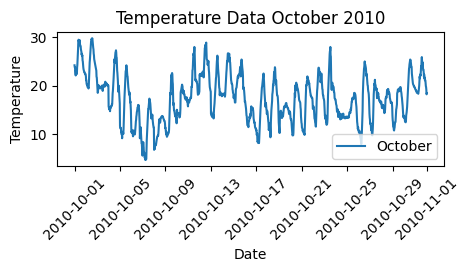

In [223]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2010')
plt.legend()
plt.xticks(rotation=45)

Plot data November

(array([14914., 14918., 14922., 14926., 14930., 14934., 14938., 14942.,
        14944.]),
 [Text(14914.0, 0, '2010-11-01'),
  Text(14918.0, 0, '2010-11-05'),
  Text(14922.0, 0, '2010-11-09'),
  Text(14926.0, 0, '2010-11-13'),
  Text(14930.0, 0, '2010-11-17'),
  Text(14934.0, 0, '2010-11-21'),
  Text(14938.0, 0, '2010-11-25'),
  Text(14942.0, 0, '2010-11-29'),
  Text(14944.0, 0, '2010-12-01')])

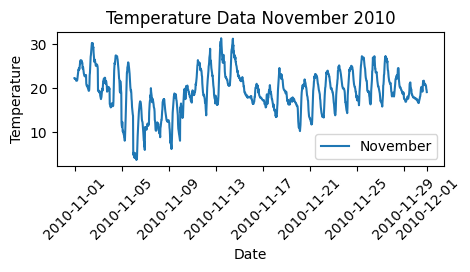

In [224]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2010')
plt.legend()
plt.xticks(rotation=45)

Plot data December

(array([14944., 14948., 14952., 14956., 14960., 14964., 14968., 14972.,
        14975.]),
 [Text(14944.0, 0, '2010-12-01'),
  Text(14948.0, 0, '2010-12-05'),
  Text(14952.0, 0, '2010-12-09'),
  Text(14956.0, 0, '2010-12-13'),
  Text(14960.0, 0, '2010-12-17'),
  Text(14964.0, 0, '2010-12-21'),
  Text(14968.0, 0, '2010-12-25'),
  Text(14972.0, 0, '2010-12-29'),
  Text(14975.0, 0, '2011-01-01')])

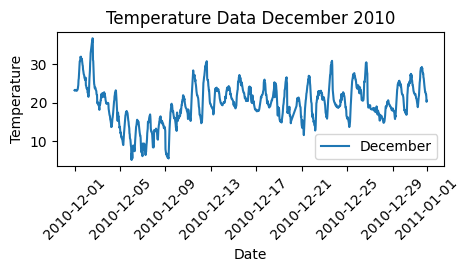

In [225]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2010')
plt.legend()
plt.xticks(rotation=45)

In [226]:
plt.figure(figsize=(17, 8))
plt.tight_layout()
plt.show()

<Figure size 1700x800 with 0 Axes>

In [227]:
#### Plot Temperatur 2011

<ipython-input-228-91662b636c23>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


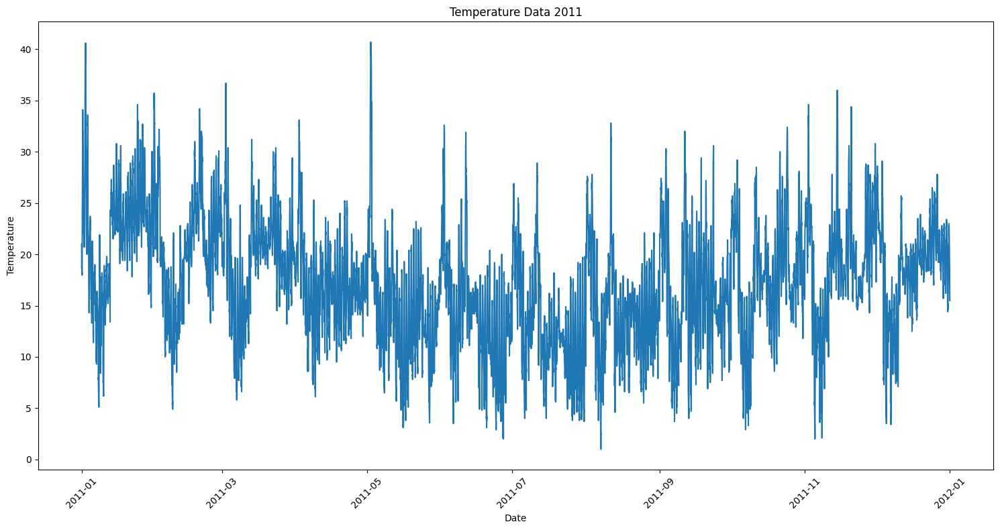

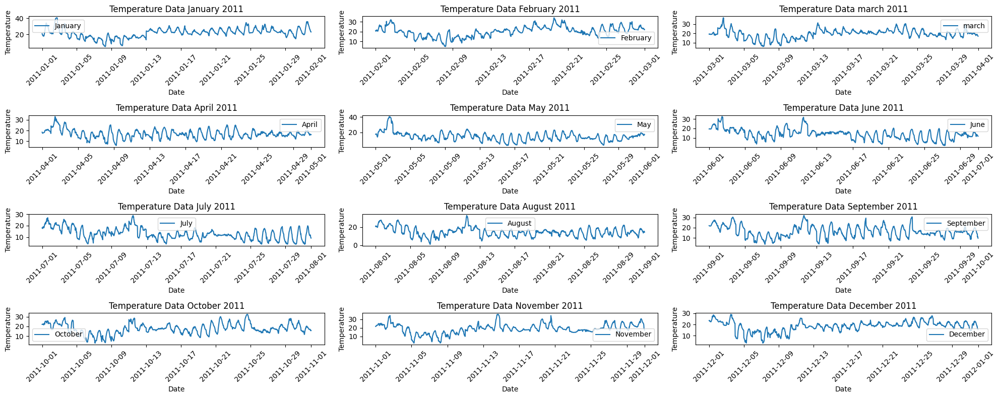

In [228]:

# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')
# Data filter only for  January 2010
data_2011 = temp_clean[(temp_clean['DATETIME'].dt.year == 2011)]
data_2011 = data_2011.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2011['DATETIME'], data_2011['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2011')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()
import matplotlib.pyplot as plt
import pandas as pd
# Data filter only for  2011
data_2011 = temp_clean[temp_clean['DATETIME'].dt.year == 2011]
# Separate data by month
january_data = data_2011[data_2011['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2011[data_2011['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2011[data_2011['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2011[data_2011['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2011[data_2011['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2011[data_2011['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2011[data_2011['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2011[data_2011['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2011[data_2011['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2011[data_2011['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2011[data_2011['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2011[data_2011['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')
# Create manual subplots
plt.figure(figsize=(20, 8))
# Plot data January
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2011')
plt.legend()
plt.xticks(rotation=45)
# Plot data February
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2011')
plt.legend()
plt.xticks(rotation=45)
# Plot data march
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data march 2011')
plt.legend()
plt.xticks(rotation=45)
# Plot data April
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2011')
plt.legend()
plt.xticks(rotation=45)
# Plot data May
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2011')
plt.legend()
plt.xticks(rotation=45)
# Plot data June
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2011')
plt.legend()
plt.xticks(rotation=45)
# Plot data July
plt.subplot(4, 3, 7)  # 3  rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2011')
plt.legend()
plt.xticks(rotation=45)
# Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2011')
plt.legend()
plt.xticks(rotation=45)
# Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2011')
plt.legend()
plt.xticks(rotation=45)
# Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2011')
plt.legend()
plt.xticks(rotation=45)
# Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2011')
plt.legend()
plt.xticks(rotation=45)
# Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2011')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
### Plot Temperatur 2012


Convert DATETIME column to datetime type

In [229]:
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')

<ipython-input-229-af5b2893390f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


Data filter only for  January 2010

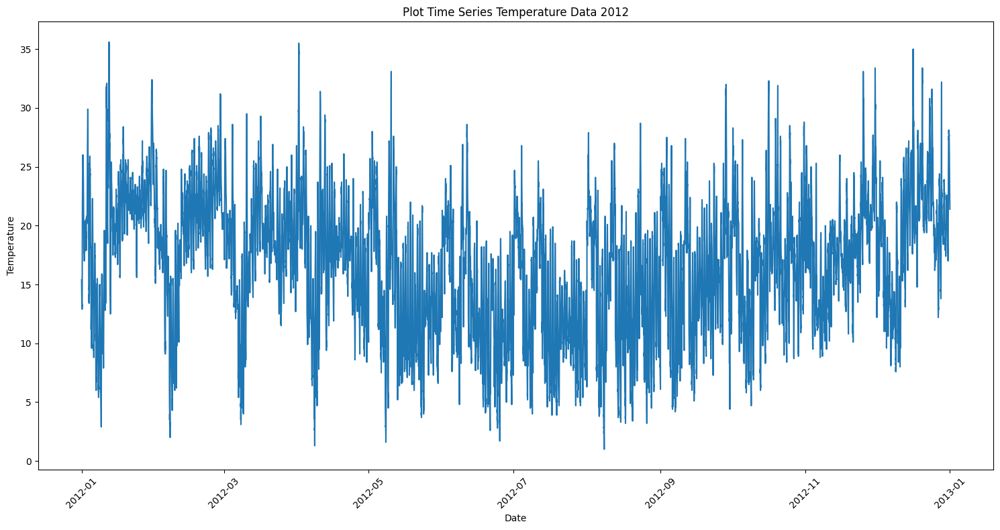

In [230]:
data_2012 = temp_clean[(temp_clean['DATETIME'].dt.year == 2012)]
data_2012 = data_2012.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2012['DATETIME'], data_2012['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Plot Time Series Temperature Data 2012')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

In [231]:
import matplotlib.pyplot as plt
import pandas as pd

Data filter only for  2012

In [232]:
data_2012 = temp_clean[temp_clean['DATETIME'].dt.year == 2012]

Separate data by month

In [233]:
january_data = data_2012[data_2012['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2012[data_2012['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2012[data_2012['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2012[data_2012['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2012[data_2012['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2012[data_2012['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2012[data_2012['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2012[data_2012['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2012[data_2012['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2012[data_2012['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2012[data_2012['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2012[data_2012['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

Create manual subplots

In [234]:
plt.figure(figsize=(20, 8))

<Figure size 2000x800 with 0 Axes>

<Figure size 2000x800 with 0 Axes>

Plot data January

(array([15340., 15344., 15348., 15352., 15356., 15360., 15364., 15368.,
        15371.]),
 [Text(15340.0, 0, '2012-01-01'),
  Text(15344.0, 0, '2012-01-05'),
  Text(15348.0, 0, '2012-01-09'),
  Text(15352.0, 0, '2012-01-13'),
  Text(15356.0, 0, '2012-01-17'),
  Text(15360.0, 0, '2012-01-21'),
  Text(15364.0, 0, '2012-01-25'),
  Text(15368.0, 0, '2012-01-29'),
  Text(15371.0, 0, '2012-02-01')])

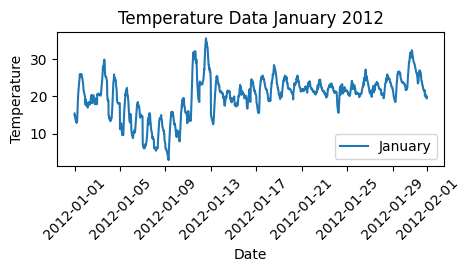

In [235]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2012')
plt.legend()
plt.xticks(rotation=45)

Plot data February

(array([15371., 15375., 15379., 15383., 15387., 15391., 15395., 15399.,
        15400.]),
 [Text(15371.0, 0, '2012-02-01'),
  Text(15375.0, 0, '2012-02-05'),
  Text(15379.0, 0, '2012-02-09'),
  Text(15383.0, 0, '2012-02-13'),
  Text(15387.0, 0, '2012-02-17'),
  Text(15391.0, 0, '2012-02-21'),
  Text(15395.0, 0, '2012-02-25'),
  Text(15399.0, 0, '2012-02-29'),
  Text(15400.0, 0, '2012-03-01')])

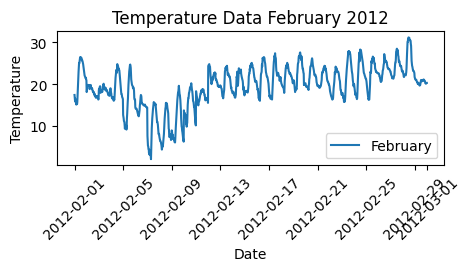

In [236]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2012')
plt.legend()
plt.xticks(rotation=45)

Plot data march

(array([15399., 15400., 15404., 15408., 15412., 15416., 15420., 15424.,
        15428., 15431.]),
 [Text(15399.0, 0, '2012-02-29'),
  Text(15400.0, 0, '2012-03-01'),
  Text(15404.0, 0, '2012-03-05'),
  Text(15408.0, 0, '2012-03-09'),
  Text(15412.0, 0, '2012-03-13'),
  Text(15416.0, 0, '2012-03-17'),
  Text(15420.0, 0, '2012-03-21'),
  Text(15424.0, 0, '2012-03-25'),
  Text(15428.0, 0, '2012-03-29'),
  Text(15431.0, 0, '2012-04-01')])

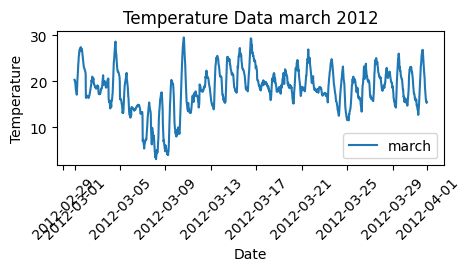

In [237]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data march 2012')
plt.legend()
plt.xticks(rotation=45)

Plot data April

(array([15431., 15435., 15439., 15443., 15447., 15451., 15455., 15459.,
        15461.]),
 [Text(15431.0, 0, '2012-04-01'),
  Text(15435.0, 0, '2012-04-05'),
  Text(15439.0, 0, '2012-04-09'),
  Text(15443.0, 0, '2012-04-13'),
  Text(15447.0, 0, '2012-04-17'),
  Text(15451.0, 0, '2012-04-21'),
  Text(15455.0, 0, '2012-04-25'),
  Text(15459.0, 0, '2012-04-29'),
  Text(15461.0, 0, '2012-05-01')])

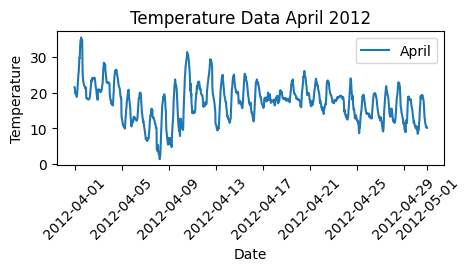

In [238]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2012')
plt.legend()
plt.xticks(rotation=45)

Plot data May

(array([15461., 15465., 15469., 15473., 15477., 15481., 15485., 15489.,
        15492.]),
 [Text(15461.0, 0, '2012-05-01'),
  Text(15465.0, 0, '2012-05-05'),
  Text(15469.0, 0, '2012-05-09'),
  Text(15473.0, 0, '2012-05-13'),
  Text(15477.0, 0, '2012-05-17'),
  Text(15481.0, 0, '2012-05-21'),
  Text(15485.0, 0, '2012-05-25'),
  Text(15489.0, 0, '2012-05-29'),
  Text(15492.0, 0, '2012-06-01')])

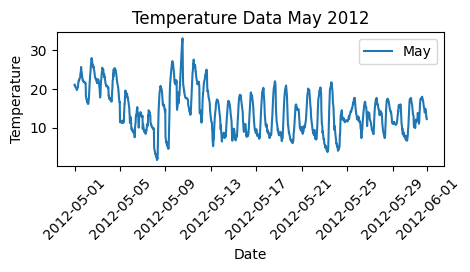

In [239]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2012')
plt.legend()
plt.xticks(rotation=45)

Plot data June

(array([15492., 15496., 15500., 15504., 15508., 15512., 15516., 15520.,
        15522.]),
 [Text(15492.0, 0, '2012-06-01'),
  Text(15496.0, 0, '2012-06-05'),
  Text(15500.0, 0, '2012-06-09'),
  Text(15504.0, 0, '2012-06-13'),
  Text(15508.0, 0, '2012-06-17'),
  Text(15512.0, 0, '2012-06-21'),
  Text(15516.0, 0, '2012-06-25'),
  Text(15520.0, 0, '2012-06-29'),
  Text(15522.0, 0, '2012-07-01')])

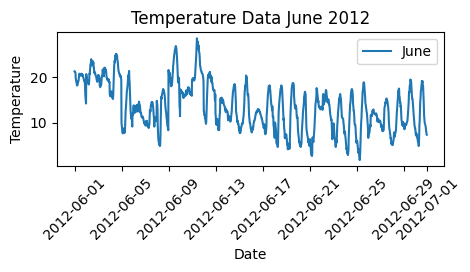

In [240]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2012')
plt.legend()
plt.xticks(rotation=45)

Plot data July

(array([15522., 15526., 15530., 15534., 15538., 15542., 15546., 15550.,
        15553.]),
 [Text(15522.0, 0, '2012-07-01'),
  Text(15526.0, 0, '2012-07-05'),
  Text(15530.0, 0, '2012-07-09'),
  Text(15534.0, 0, '2012-07-13'),
  Text(15538.0, 0, '2012-07-17'),
  Text(15542.0, 0, '2012-07-21'),
  Text(15546.0, 0, '2012-07-25'),
  Text(15550.0, 0, '2012-07-29'),
  Text(15553.0, 0, '2012-08-01')])

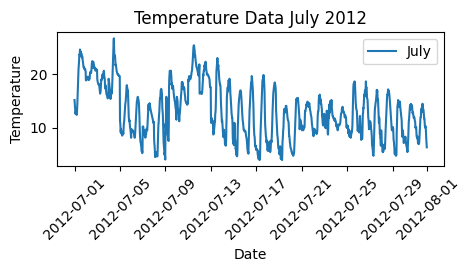

In [241]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 7)  # 3  rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2012')
plt.legend()
plt.xticks(rotation=45)

Plot data November

(array([15645., 15649., 15653., 15657., 15661., 15665., 15669., 15673.,
        15675.]),
 [Text(15645.0, 0, '2012-11-01'),
  Text(15649.0, 0, '2012-11-05'),
  Text(15653.0, 0, '2012-11-09'),
  Text(15657.0, 0, '2012-11-13'),
  Text(15661.0, 0, '2012-11-17'),
  Text(15665.0, 0, '2012-11-21'),
  Text(15669.0, 0, '2012-11-25'),
  Text(15673.0, 0, '2012-11-29'),
  Text(15675.0, 0, '2012-12-01')])

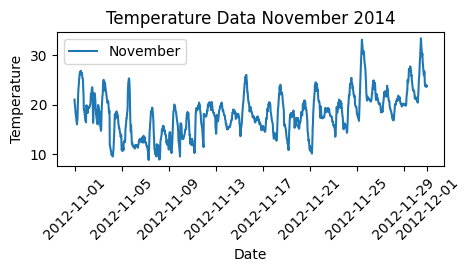

In [242]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data December

(array([15675., 15679., 15683., 15687., 15691., 15695., 15699., 15703.,
        15706.]),
 [Text(15675.0, 0, '2012-12-01'),
  Text(15679.0, 0, '2012-12-05'),
  Text(15683.0, 0, '2012-12-09'),
  Text(15687.0, 0, '2012-12-13'),
  Text(15691.0, 0, '2012-12-17'),
  Text(15695.0, 0, '2012-12-21'),
  Text(15699.0, 0, '2012-12-25'),
  Text(15703.0, 0, '2012-12-29'),
  Text(15706.0, 0, '2013-01-01')])

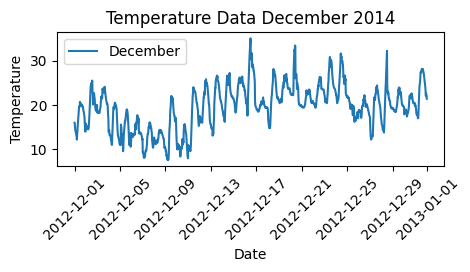

In [243]:
plt.figure(figsize=(17, 8))
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2014')
plt.legend()
plt.xticks(rotation=45)

In [244]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

<ipython-input-245-046cac6e7360>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


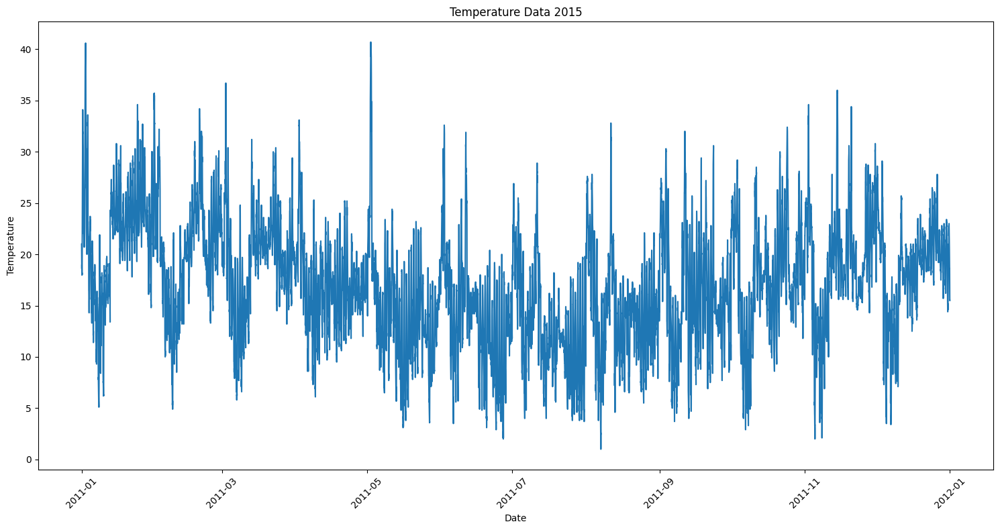

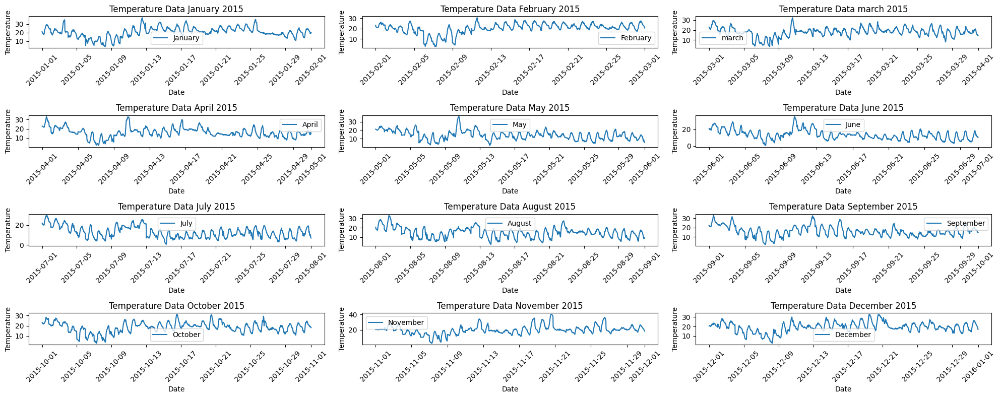

In [245]:

#### Plot Temperatur 2015

# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')
# Data filter only for  January 2010
data_2015 = temp_clean[(temp_clean['DATETIME'].dt.year == 2011)]
data_2015 = data_2015.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2015['DATETIME'], data_2015['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2015')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()
import matplotlib.pyplot as plt
import pandas as pd
# Data filter only for  2015
data_2015 = temp_clean[temp_clean['DATETIME'].dt.year == 2015]
# Separate data by month
january_data = data_2015[data_2015['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2015[data_2015['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2015[data_2015['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2015[data_2015['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2015[data_2015['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2015[data_2015['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2015[data_2015['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2015[data_2015['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2015[data_2015['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2015[data_2015['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2015[data_2015['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2015[data_2015['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')
# Create manual subplots
plt.figure(figsize=(20, 8))
# Plot data January
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2015')
plt.legend()
plt.xticks(rotation=45)
# Plot data February
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2015')
plt.legend()
plt.xticks(rotation=45)
# Plot data march
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data march 2015')
plt.legend()
plt.xticks(rotation=45)
# Plot data April
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2015')
plt.legend()
plt.xticks(rotation=45)
# Plot data May
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2015')
plt.legend()
plt.xticks(rotation=45)
# Plot data June
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2015')
plt.legend()
plt.xticks(rotation=45)
# Plot data July
plt.subplot(4, 3, 7)  # 3  rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2015')
plt.legend()
plt.xticks(rotation=45)
# Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2015')
plt.legend()
plt.xticks(rotation=45)
# Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2015')
plt.legend()
plt.xticks(rotation=45)
# Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2015')
plt.legend()
plt.xticks(rotation=45)
# Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2015')
plt.legend()
plt.xticks(rotation=45)
# Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2015')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
### Plot Temperatur 2016


Convert DATETIME column to datetime type

In [246]:
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')

<ipython-input-246-af5b2893390f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


Data filter only for  January 2010

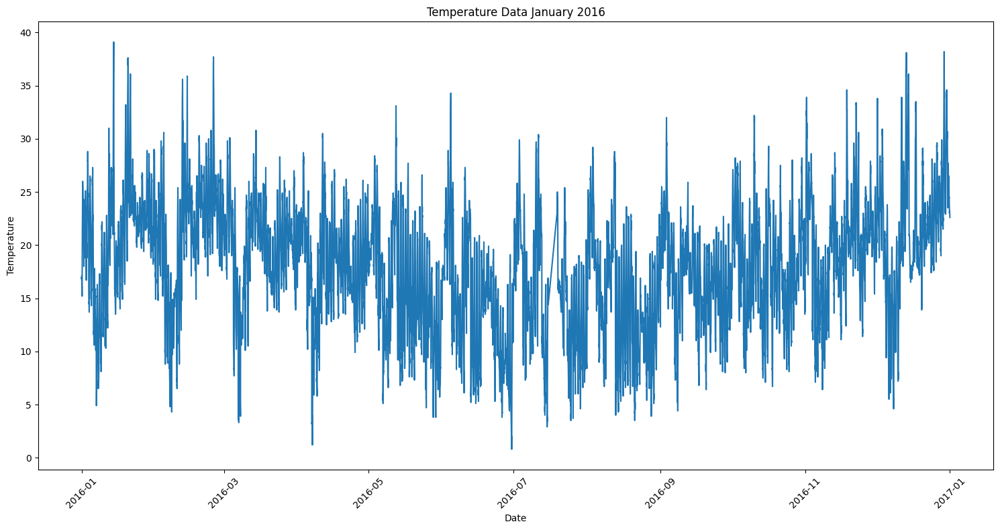

In [247]:
data_2016 = temp_clean[(temp_clean['DATETIME'].dt.year == 2016)]
data_2016 = data_2016.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2016['DATETIME'], data_2016['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2016')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

In [248]:
import matplotlib.pyplot as plt
import pandas as pd

Data filter only for  2016

In [249]:
data_2016 = temp_clean[temp_clean['DATETIME'].dt.year == 2016]

Separate data by month

In [250]:
january_data = data_2016[data_2016['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2016[data_2016['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2016[data_2016['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2016[data_2016['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2016[data_2016['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2016[data_2016['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2016[data_2016['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2016[data_2016['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2016[data_2016['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2016[data_2016['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2016[data_2016['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2016[data_2016['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

Create manual subplots

In [251]:
plt.figure(figsize=(20, 8))

<Figure size 2000x800 with 0 Axes>

<Figure size 2000x800 with 0 Axes>

Plot data January

(array([16801., 16805., 16809., 16813., 16817., 16821., 16825., 16829.,
        16832.]),
 [Text(16801.0, 0, '2016-01-01'),
  Text(16805.0, 0, '2016-01-05'),
  Text(16809.0, 0, '2016-01-09'),
  Text(16813.0, 0, '2016-01-13'),
  Text(16817.0, 0, '2016-01-17'),
  Text(16821.0, 0, '2016-01-21'),
  Text(16825.0, 0, '2016-01-25'),
  Text(16829.0, 0, '2016-01-29'),
  Text(16832.0, 0, '2016-02-01')])

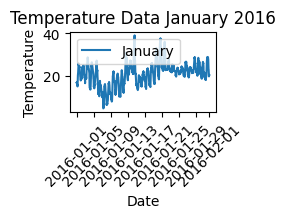

In [252]:
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data February

(array([16832., 16836., 16840., 16844., 16848., 16852., 16856., 16860.,
        16861.]),
 [Text(16832.0, 0, '2016-02-01'),
  Text(16836.0, 0, '2016-02-05'),
  Text(16840.0, 0, '2016-02-09'),
  Text(16844.0, 0, '2016-02-13'),
  Text(16848.0, 0, '2016-02-17'),
  Text(16852.0, 0, '2016-02-21'),
  Text(16856.0, 0, '2016-02-25'),
  Text(16860.0, 0, '2016-02-29'),
  Text(16861.0, 0, '2016-03-01')])

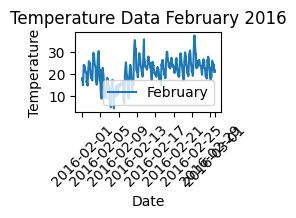

In [253]:
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data march

(array([16860., 16861., 16865., 16869., 16873., 16877., 16881., 16885.,
        16889., 16892.]),
 [Text(16860.0, 0, '2016-02-29'),
  Text(16861.0, 0, '2016-03-01'),
  Text(16865.0, 0, '2016-03-05'),
  Text(16869.0, 0, '2016-03-09'),
  Text(16873.0, 0, '2016-03-13'),
  Text(16877.0, 0, '2016-03-17'),
  Text(16881.0, 0, '2016-03-21'),
  Text(16885.0, 0, '2016-03-25'),
  Text(16889.0, 0, '2016-03-29'),
  Text(16892.0, 0, '2016-04-01')])

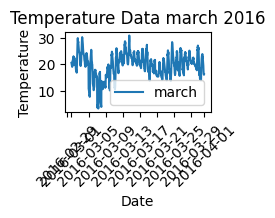

In [254]:
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data march 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data April

(array([16892., 16896., 16900., 16904., 16908., 16912., 16916., 16920.,
        16922.]),
 [Text(16892.0, 0, '2016-04-01'),
  Text(16896.0, 0, '2016-04-05'),
  Text(16900.0, 0, '2016-04-09'),
  Text(16904.0, 0, '2016-04-13'),
  Text(16908.0, 0, '2016-04-17'),
  Text(16912.0, 0, '2016-04-21'),
  Text(16916.0, 0, '2016-04-25'),
  Text(16920.0, 0, '2016-04-29'),
  Text(16922.0, 0, '2016-05-01')])

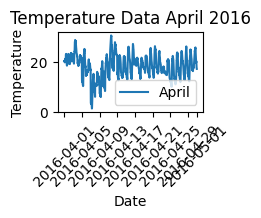

In [255]:
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data May

(array([16922., 16926., 16930., 16934., 16938., 16942., 16946., 16950.,
        16953.]),
 [Text(16922.0, 0, '2016-05-01'),
  Text(16926.0, 0, '2016-05-05'),
  Text(16930.0, 0, '2016-05-09'),
  Text(16934.0, 0, '2016-05-13'),
  Text(16938.0, 0, '2016-05-17'),
  Text(16942.0, 0, '2016-05-21'),
  Text(16946.0, 0, '2016-05-25'),
  Text(16950.0, 0, '2016-05-29'),
  Text(16953.0, 0, '2016-06-01')])

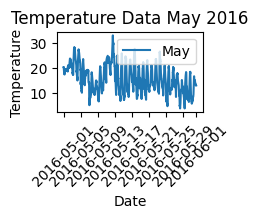

In [256]:
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data June

(array([16953., 16957., 16961., 16965., 16969., 16973., 16977., 16981.,
        16983.]),
 [Text(16953.0, 0, '2016-06-01'),
  Text(16957.0, 0, '2016-06-05'),
  Text(16961.0, 0, '2016-06-09'),
  Text(16965.0, 0, '2016-06-13'),
  Text(16969.0, 0, '2016-06-17'),
  Text(16973.0, 0, '2016-06-21'),
  Text(16977.0, 0, '2016-06-25'),
  Text(16981.0, 0, '2016-06-29'),
  Text(16983.0, 0, '2016-07-01')])

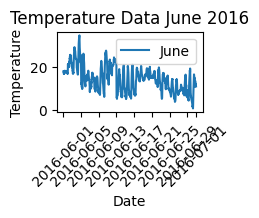

In [257]:
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data July

(array([16983., 16987., 16991., 16995., 16999., 17003., 17007., 17011.,
        17014.]),
 [Text(16983.0, 0, '2016-07-01'),
  Text(16987.0, 0, '2016-07-05'),
  Text(16991.0, 0, '2016-07-09'),
  Text(16995.0, 0, '2016-07-13'),
  Text(16999.0, 0, '2016-07-17'),
  Text(17003.0, 0, '2016-07-21'),
  Text(17007.0, 0, '2016-07-25'),
  Text(17011.0, 0, '2016-07-29'),
  Text(17014.0, 0, '2016-08-01')])

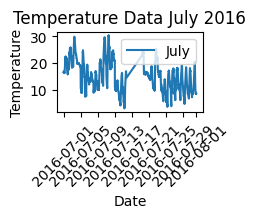

In [258]:
plt.subplot(4, 3, 7)  # 3  rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data August

(array([17014., 17018., 17022., 17026., 17030., 17034., 17038., 17042.,
        17045.]),
 [Text(17014.0, 0, '2016-08-01'),
  Text(17018.0, 0, '2016-08-05'),
  Text(17022.0, 0, '2016-08-09'),
  Text(17026.0, 0, '2016-08-13'),
  Text(17030.0, 0, '2016-08-17'),
  Text(17034.0, 0, '2016-08-21'),
  Text(17038.0, 0, '2016-08-25'),
  Text(17042.0, 0, '2016-08-29'),
  Text(17045.0, 0, '2016-09-01')])

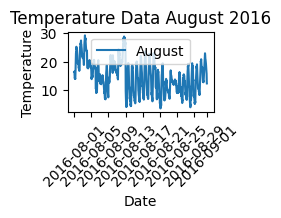

In [259]:
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data September

(array([17045., 17049., 17053., 17057., 17061., 17065., 17069., 17073.,
        17075.]),
 [Text(17045.0, 0, '2016-09-01'),
  Text(17049.0, 0, '2016-09-05'),
  Text(17053.0, 0, '2016-09-09'),
  Text(17057.0, 0, '2016-09-13'),
  Text(17061.0, 0, '2016-09-17'),
  Text(17065.0, 0, '2016-09-21'),
  Text(17069.0, 0, '2016-09-25'),
  Text(17073.0, 0, '2016-09-29'),
  Text(17075.0, 0, '2016-10-01')])

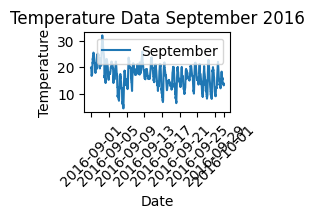

In [260]:
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data October

(array([17075., 17079., 17083., 17087., 17091., 17095., 17099., 17103.,
        17106.]),
 [Text(17075.0, 0, '2016-10-01'),
  Text(17079.0, 0, '2016-10-05'),
  Text(17083.0, 0, '2016-10-09'),
  Text(17087.0, 0, '2016-10-13'),
  Text(17091.0, 0, '2016-10-17'),
  Text(17095.0, 0, '2016-10-21'),
  Text(17099.0, 0, '2016-10-25'),
  Text(17103.0, 0, '2016-10-29'),
  Text(17106.0, 0, '2016-11-01')])

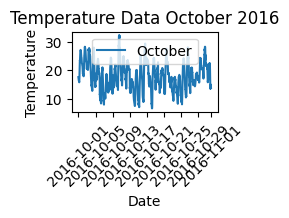

In [261]:
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data November

(array([17106., 17110., 17114., 17118., 17122., 17126., 17130., 17134.,
        17136.]),
 [Text(17106.0, 0, '2016-11-01'),
  Text(17110.0, 0, '2016-11-05'),
  Text(17114.0, 0, '2016-11-09'),
  Text(17118.0, 0, '2016-11-13'),
  Text(17122.0, 0, '2016-11-17'),
  Text(17126.0, 0, '2016-11-21'),
  Text(17130.0, 0, '2016-11-25'),
  Text(17134.0, 0, '2016-11-29'),
  Text(17136.0, 0, '2016-12-01')])

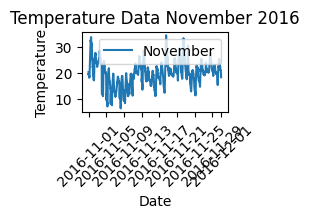

In [262]:
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data December

(array([17136., 17140., 17144., 17148., 17152., 17156., 17160., 17164.,
        17167.]),
 [Text(17136.0, 0, '2016-12-01'),
  Text(17140.0, 0, '2016-12-05'),
  Text(17144.0, 0, '2016-12-09'),
  Text(17148.0, 0, '2016-12-13'),
  Text(17152.0, 0, '2016-12-17'),
  Text(17156.0, 0, '2016-12-21'),
  Text(17160.0, 0, '2016-12-25'),
  Text(17164.0, 0, '2016-12-29'),
  Text(17167.0, 0, '2017-01-01')])

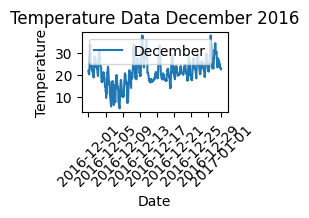

In [263]:
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2016')
plt.legend()
plt.xticks(rotation=45)

In [264]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

<ipython-input-265-9fd5141551e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


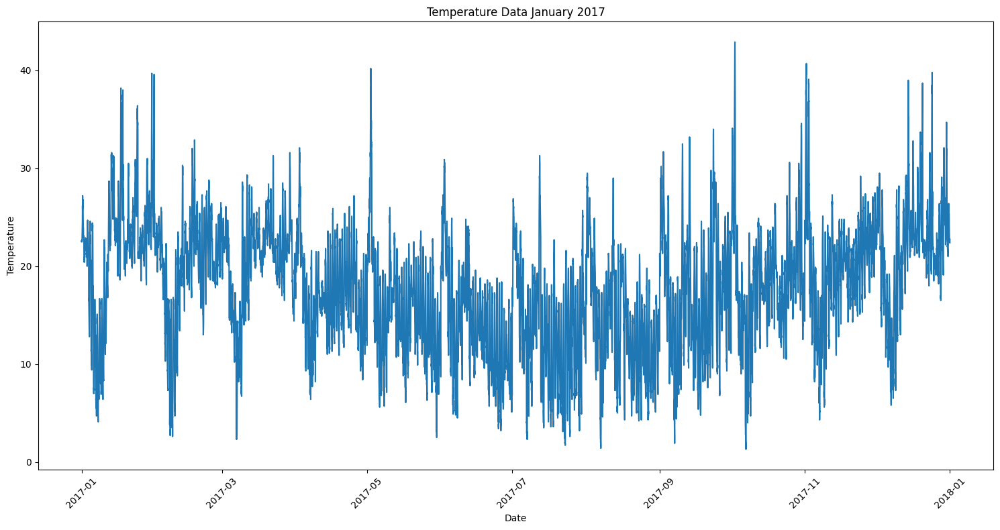

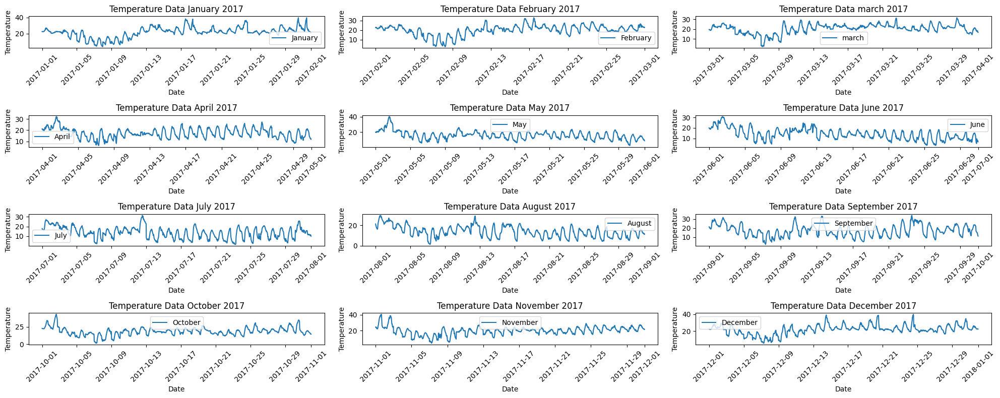

In [265]:

#### Plot Temperature 2017

# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')
# Data filter only for  January 2010
data_2017 = temp_clean[(temp_clean['DATETIME'].dt.year == 2017)]
data_2017 = data_2017.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2017['DATETIME'], data_2017['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2017')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()
import matplotlib.pyplot as plt
import pandas as pd
# Data filter only for  2017
data_2017 = temp_clean[temp_clean['DATETIME'].dt.year == 2017]
# Separate data by month
january_data = data_2017[data_2017['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2017[data_2017['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2017[data_2017['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2017[data_2017['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2017[data_2017['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2017[data_2017['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2017[data_2017['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2017[data_2017['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2017[data_2017['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2017[data_2017['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2017[data_2017['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2017[data_2017['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')
# Create manual subplots
plt.figure(figsize=(20, 8))
# Plot data January
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2017')
plt.legend()
plt.xticks(rotation=45)
# Plot data February
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2017')
plt.legend()
plt.xticks(rotation=45)
# Plot data march
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data march 2017')
plt.legend()
plt.xticks(rotation=45)
# Plot data April
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2017')
plt.legend()
plt.xticks(rotation=45)
# Plot data May
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2017')
plt.legend()
plt.xticks(rotation=45)
# Plot data June
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2017')
plt.legend()
plt.xticks(rotation=45)
# Plot data July
plt.subplot(4, 3, 7)  # 3  rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2017')
plt.legend()
plt.xticks(rotation=45)
# Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2017')
plt.legend()
plt.xticks(rotation=45)
# Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2017')
plt.legend()
plt.xticks(rotation=45)
# Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2017')
plt.legend()
plt.xticks(rotation=45)
# Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2017')
plt.legend()
plt.xticks(rotation=45)
# Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2017')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
### Plot Temperature 2018


Convert DATETIME column to datetime type

In [266]:
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')

<ipython-input-266-af5b2893390f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


Data filter only for  January 2010

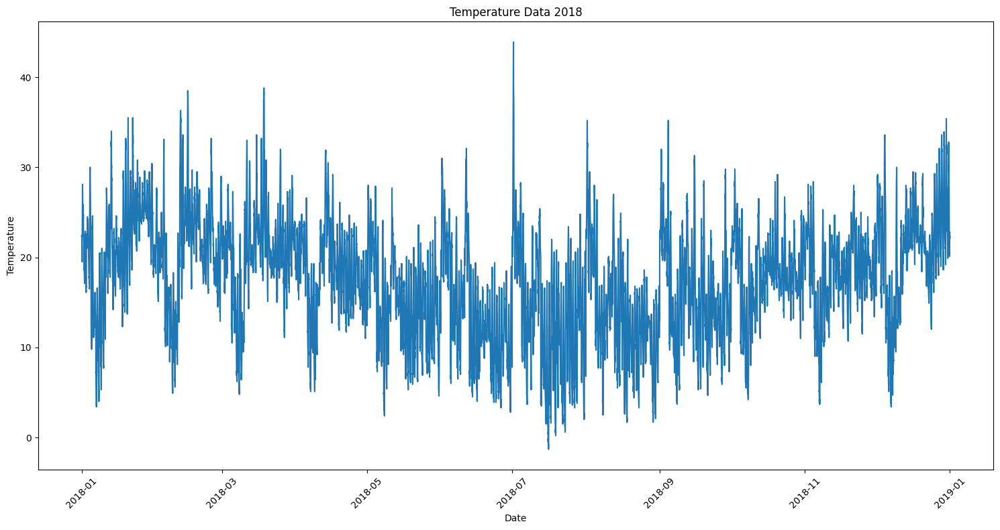

In [267]:
data_2018 = temp_clean[(temp_clean['DATETIME'].dt.year == 2018)]
data_2018 = data_2018.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2018['DATETIME'], data_2018['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2018')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

In [268]:
import matplotlib.pyplot as plt
import pandas as pd

Data filter only for  2018

In [269]:
data_2018 = temp_clean[temp_clean['DATETIME'].dt.year == 2018]

Separate data by month

In [270]:
january_data = data_2018[data_2018['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2018[data_2018['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2018[data_2018['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2018[data_2018['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2018[data_2018['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2018[data_2018['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2018[data_2018['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2018[data_2018['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2018[data_2018['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2018[data_2018['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2018[data_2018['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2018[data_2018['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

Create manual subplots

In [271]:
plt.figure(figsize=(20, 8))

<Figure size 2000x800 with 0 Axes>

<Figure size 2000x800 with 0 Axes>

Plot data January

(array([17532., 17536., 17540., 17544., 17548., 17552., 17556., 17560.,
        17563.]),
 [Text(17532.0, 0, '2018-01-01'),
  Text(17536.0, 0, '2018-01-05'),
  Text(17540.0, 0, '2018-01-09'),
  Text(17544.0, 0, '2018-01-13'),
  Text(17548.0, 0, '2018-01-17'),
  Text(17552.0, 0, '2018-01-21'),
  Text(17556.0, 0, '2018-01-25'),
  Text(17560.0, 0, '2018-01-29'),
  Text(17563.0, 0, '2018-02-01')])

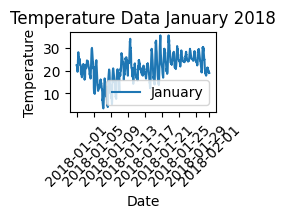

In [272]:
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data February

(array([17563., 17567., 17571., 17575., 17579., 17583., 17587., 17591.]),
 [Text(17563.0, 0, '2018-02-01'),
  Text(17567.0, 0, '2018-02-05'),
  Text(17571.0, 0, '2018-02-09'),
  Text(17575.0, 0, '2018-02-13'),
  Text(17579.0, 0, '2018-02-17'),
  Text(17583.0, 0, '2018-02-21'),
  Text(17587.0, 0, '2018-02-25'),
  Text(17591.0, 0, '2018-03-01')])

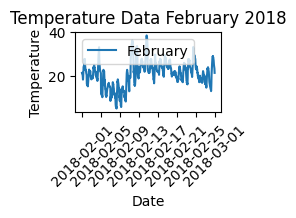

In [273]:
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data march

(array([17591., 17595., 17599., 17603., 17607., 17611., 17615., 17619.,
        17622.]),
 [Text(17591.0, 0, '2018-03-01'),
  Text(17595.0, 0, '2018-03-05'),
  Text(17599.0, 0, '2018-03-09'),
  Text(17603.0, 0, '2018-03-13'),
  Text(17607.0, 0, '2018-03-17'),
  Text(17611.0, 0, '2018-03-21'),
  Text(17615.0, 0, '2018-03-25'),
  Text(17619.0, 0, '2018-03-29'),
  Text(17622.0, 0, '2018-04-01')])

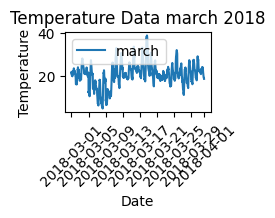

In [274]:
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data march 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data April

(array([17622., 17626., 17630., 17634., 17638., 17642., 17646., 17650.,
        17652.]),
 [Text(17622.0, 0, '2018-04-01'),
  Text(17626.0, 0, '2018-04-05'),
  Text(17630.0, 0, '2018-04-09'),
  Text(17634.0, 0, '2018-04-13'),
  Text(17638.0, 0, '2018-04-17'),
  Text(17642.0, 0, '2018-04-21'),
  Text(17646.0, 0, '2018-04-25'),
  Text(17650.0, 0, '2018-04-29'),
  Text(17652.0, 0, '2018-05-01')])

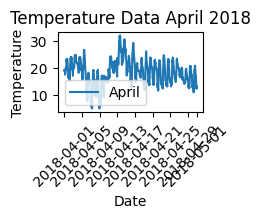

In [275]:
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data May

(array([17652., 17656., 17660., 17664., 17668., 17672., 17676., 17680.,
        17683.]),
 [Text(17652.0, 0, '2018-05-01'),
  Text(17656.0, 0, '2018-05-05'),
  Text(17660.0, 0, '2018-05-09'),
  Text(17664.0, 0, '2018-05-13'),
  Text(17668.0, 0, '2018-05-17'),
  Text(17672.0, 0, '2018-05-21'),
  Text(17676.0, 0, '2018-05-25'),
  Text(17680.0, 0, '2018-05-29'),
  Text(17683.0, 0, '2018-06-01')])

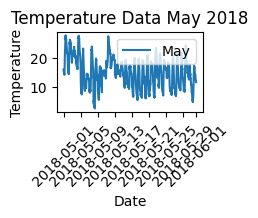

In [276]:
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data June

(array([17683., 17687., 17691., 17695., 17699., 17703., 17707., 17711.,
        17713.]),
 [Text(17683.0, 0, '2018-06-01'),
  Text(17687.0, 0, '2018-06-05'),
  Text(17691.0, 0, '2018-06-09'),
  Text(17695.0, 0, '2018-06-13'),
  Text(17699.0, 0, '2018-06-17'),
  Text(17703.0, 0, '2018-06-21'),
  Text(17707.0, 0, '2018-06-25'),
  Text(17711.0, 0, '2018-06-29'),
  Text(17713.0, 0, '2018-07-01')])

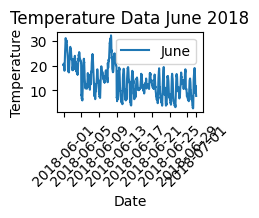

In [277]:
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data July

(array([17713., 17717., 17721., 17725., 17729., 17733., 17737., 17741.,
        17744.]),
 [Text(17713.0, 0, '2018-07-01'),
  Text(17717.0, 0, '2018-07-05'),
  Text(17721.0, 0, '2018-07-09'),
  Text(17725.0, 0, '2018-07-13'),
  Text(17729.0, 0, '2018-07-17'),
  Text(17733.0, 0, '2018-07-21'),
  Text(17737.0, 0, '2018-07-25'),
  Text(17741.0, 0, '2018-07-29'),
  Text(17744.0, 0, '2018-08-01')])

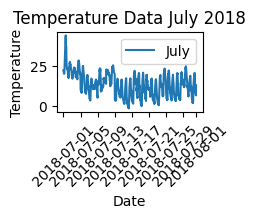

In [278]:
plt.subplot(4, 3, 7)  # 3  rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data August

(array([17744., 17748., 17752., 17756., 17760., 17764., 17768., 17772.,
        17775.]),
 [Text(17744.0, 0, '2018-08-01'),
  Text(17748.0, 0, '2018-08-05'),
  Text(17752.0, 0, '2018-08-09'),
  Text(17756.0, 0, '2018-08-13'),
  Text(17760.0, 0, '2018-08-17'),
  Text(17764.0, 0, '2018-08-21'),
  Text(17768.0, 0, '2018-08-25'),
  Text(17772.0, 0, '2018-08-29'),
  Text(17775.0, 0, '2018-09-01')])

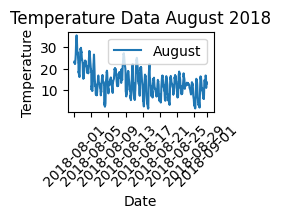

In [279]:
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data September

(array([17775., 17779., 17783., 17787., 17791., 17795., 17799., 17803.,
        17805.]),
 [Text(17775.0, 0, '2018-09-01'),
  Text(17779.0, 0, '2018-09-05'),
  Text(17783.0, 0, '2018-09-09'),
  Text(17787.0, 0, '2018-09-13'),
  Text(17791.0, 0, '2018-09-17'),
  Text(17795.0, 0, '2018-09-21'),
  Text(17799.0, 0, '2018-09-25'),
  Text(17803.0, 0, '2018-09-29'),
  Text(17805.0, 0, '2018-10-01')])

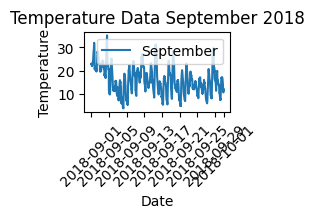

In [280]:
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data October

(array([17805., 17809., 17813., 17817., 17821., 17825., 17829., 17833.,
        17836.]),
 [Text(17805.0, 0, '2018-10-01'),
  Text(17809.0, 0, '2018-10-05'),
  Text(17813.0, 0, '2018-10-09'),
  Text(17817.0, 0, '2018-10-13'),
  Text(17821.0, 0, '2018-10-17'),
  Text(17825.0, 0, '2018-10-21'),
  Text(17829.0, 0, '2018-10-25'),
  Text(17833.0, 0, '2018-10-29'),
  Text(17836.0, 0, '2018-11-01')])

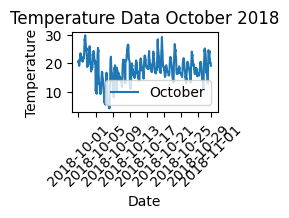

In [281]:
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data November

(array([17836., 17840., 17844., 17848., 17852., 17856., 17860., 17864.,
        17866.]),
 [Text(17836.0, 0, '2018-11-01'),
  Text(17840.0, 0, '2018-11-05'),
  Text(17844.0, 0, '2018-11-09'),
  Text(17848.0, 0, '2018-11-13'),
  Text(17852.0, 0, '2018-11-17'),
  Text(17856.0, 0, '2018-11-21'),
  Text(17860.0, 0, '2018-11-25'),
  Text(17864.0, 0, '2018-11-29'),
  Text(17866.0, 0, '2018-12-01')])

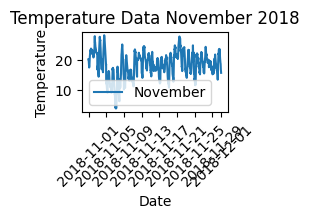

In [282]:
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data December

(array([17866., 17870., 17874., 17878., 17882., 17886., 17890., 17894.,
        17897.]),
 [Text(17866.0, 0, '2018-12-01'),
  Text(17870.0, 0, '2018-12-05'),
  Text(17874.0, 0, '2018-12-09'),
  Text(17878.0, 0, '2018-12-13'),
  Text(17882.0, 0, '2018-12-17'),
  Text(17886.0, 0, '2018-12-21'),
  Text(17890.0, 0, '2018-12-25'),
  Text(17894.0, 0, '2018-12-29'),
  Text(17897.0, 0, '2019-01-01')])

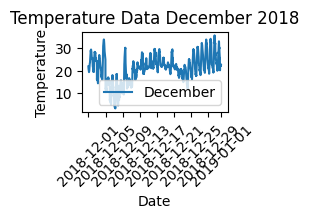

In [283]:
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2018')
plt.legend()
plt.xticks(rotation=45)

In [284]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

<ipython-input-285-1389ceb7e66b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


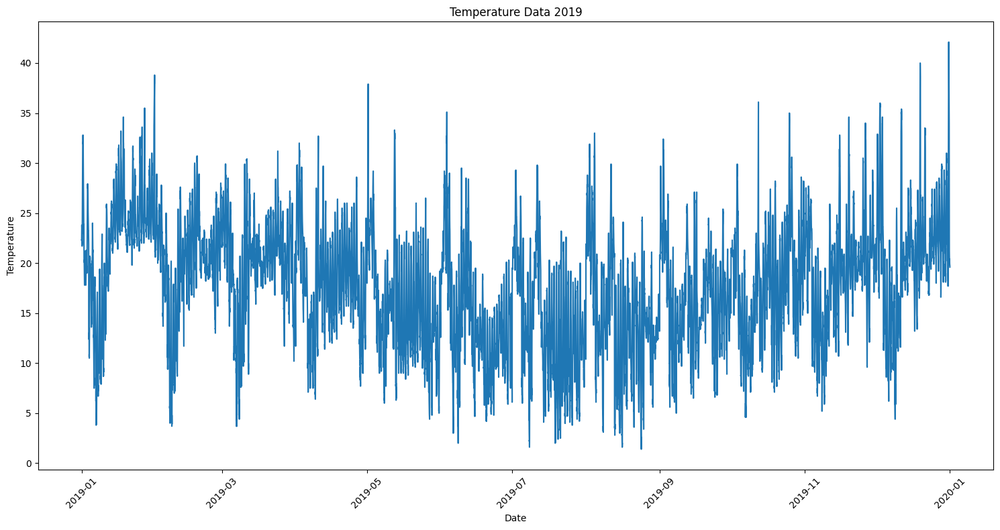

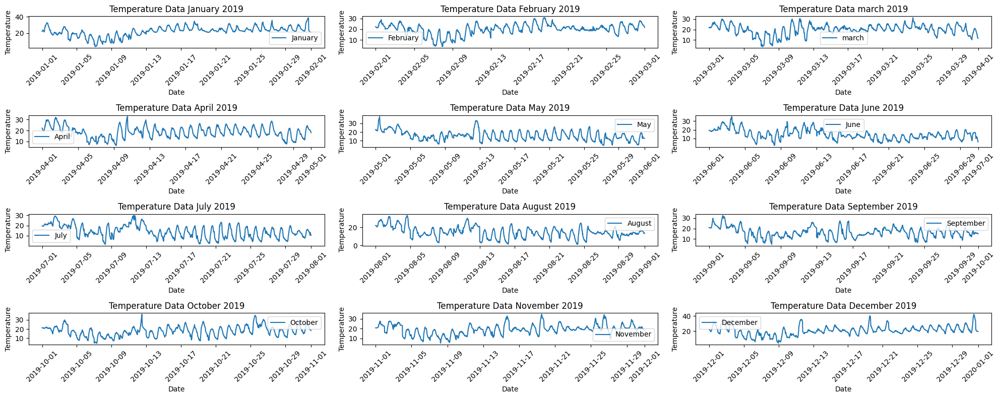

In [285]:

#### Plot Temperature 2019

# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')
# Data filter only for  January 2010
data_2019 = temp_clean[(temp_clean['DATETIME'].dt.year == 2019)]
data_2019 = data_2019.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2019['DATETIME'], data_2019['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2019')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()
import matplotlib.pyplot as plt
import pandas as pd
# Data filter only for  2019
data_2019 = temp_clean[temp_clean['DATETIME'].dt.year == 2019]
# Separate data by month
january_data = data_2019[data_2019['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2019[data_2019['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2019[data_2019['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2019[data_2019['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2019[data_2019['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2019[data_2019['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2019[data_2019['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2019[data_2019['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2019[data_2019['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2019[data_2019['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2019[data_2019['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2019[data_2019['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')
# Create manual subplots
plt.figure(figsize=(20, 8))
# Plot data January
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2019')
plt.legend()
plt.xticks(rotation=45)
# Plot data February
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2019')
plt.legend()
plt.xticks(rotation=45)
# Plot data march
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data march 2019')
plt.legend()
plt.xticks(rotation=45)
# Plot data April
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2019')
plt.legend()
plt.xticks(rotation=45)
# Plot data May
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2019')
plt.legend()
plt.xticks(rotation=45)
# Plot data June
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2019')
plt.legend()
plt.xticks(rotation=45)
# Plot data July
plt.subplot(4, 3, 7)  # 3  rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2019')
plt.legend()
plt.xticks(rotation=45)
# Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2019')
plt.legend()
plt.xticks(rotation=45)
# Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2019')
plt.legend()
plt.xticks(rotation=45)
# Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2019')
plt.legend()
plt.xticks(rotation=45)
# Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2019')
plt.legend()
plt.xticks(rotation=45)
# Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2019')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
### Plot Temperature 2020


Convert DATETIME column to datetime type

In [286]:
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')

<ipython-input-286-af5b2893390f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


Data filter only for  January 2010

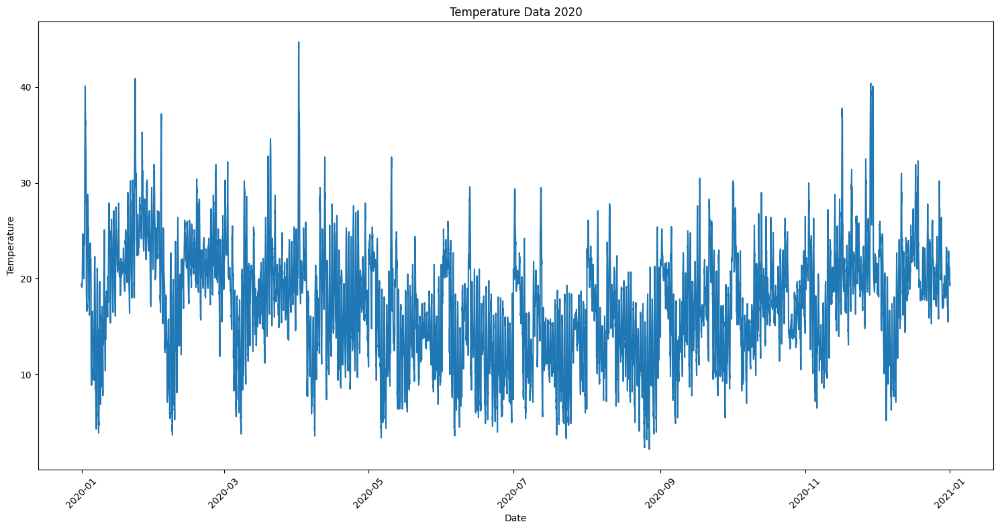

In [287]:
data_2020 = temp_clean[(temp_clean['DATETIME'].dt.year == 2020)]
data_2020 = data_2020.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2020['DATETIME'], data_2020['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2020')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

In [288]:
import matplotlib.pyplot as plt
import pandas as pd

Data filter only for  2020

In [289]:
data_2020 = temp_clean[temp_clean['DATETIME'].dt.year == 2020]

Separate data by month

In [290]:
january_data = data_2020[data_2020['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2020[data_2020['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2020[data_2020['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2020[data_2020['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2020[data_2020['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2020[data_2020['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2020[data_2020['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2020[data_2020['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2020[data_2020['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2020[data_2020['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2020[data_2020['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2020[data_2020['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

Create manual subplots

In [291]:
plt.figure(figsize=(20, 8))

<Figure size 2000x800 with 0 Axes>

<Figure size 2000x800 with 0 Axes>

Plot data January

(array([18262., 18266., 18270., 18274., 18278., 18282., 18286., 18290.,
        18293.]),
 [Text(18262.0, 0, '2020-01-01'),
  Text(18266.0, 0, '2020-01-05'),
  Text(18270.0, 0, '2020-01-09'),
  Text(18274.0, 0, '2020-01-13'),
  Text(18278.0, 0, '2020-01-17'),
  Text(18282.0, 0, '2020-01-21'),
  Text(18286.0, 0, '2020-01-25'),
  Text(18290.0, 0, '2020-01-29'),
  Text(18293.0, 0, '2020-02-01')])

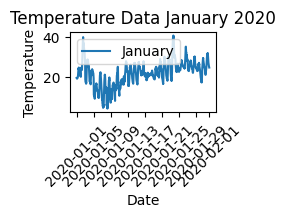

In [292]:
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2020')
plt.legend()
plt.xticks(rotation=45)

Plot data February

(array([18293., 18297., 18301., 18305., 18309., 18313., 18317., 18321.,
        18322.]),
 [Text(18293.0, 0, '2020-02-01'),
  Text(18297.0, 0, '2020-02-05'),
  Text(18301.0, 0, '2020-02-09'),
  Text(18305.0, 0, '2020-02-13'),
  Text(18309.0, 0, '2020-02-17'),
  Text(18313.0, 0, '2020-02-21'),
  Text(18317.0, 0, '2020-02-25'),
  Text(18321.0, 0, '2020-02-29'),
  Text(18322.0, 0, '2020-03-01')])

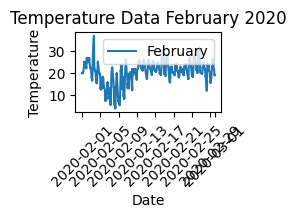

In [293]:
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2020')
plt.legend()
plt.xticks(rotation=45)

Plot data march

(array([18321., 18322., 18326., 18330., 18334., 18338., 18342., 18346.,
        18350., 18353.]),
 [Text(18321.0, 0, '2020-02-29'),
  Text(18322.0, 0, '2020-03-01'),
  Text(18326.0, 0, '2020-03-05'),
  Text(18330.0, 0, '2020-03-09'),
  Text(18334.0, 0, '2020-03-13'),
  Text(18338.0, 0, '2020-03-17'),
  Text(18342.0, 0, '2020-03-21'),
  Text(18346.0, 0, '2020-03-25'),
  Text(18350.0, 0, '2020-03-29'),
  Text(18353.0, 0, '2020-04-01')])

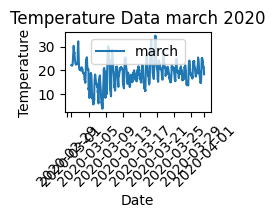

In [294]:
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data march 2020')
plt.legend()
plt.xticks(rotation=45)

Plot data April

(array([18353., 18357., 18361., 18365., 18369., 18373., 18377., 18381.,
        18383.]),
 [Text(18353.0, 0, '2020-04-01'),
  Text(18357.0, 0, '2020-04-05'),
  Text(18361.0, 0, '2020-04-09'),
  Text(18365.0, 0, '2020-04-13'),
  Text(18369.0, 0, '2020-04-17'),
  Text(18373.0, 0, '2020-04-21'),
  Text(18377.0, 0, '2020-04-25'),
  Text(18381.0, 0, '2020-04-29'),
  Text(18383.0, 0, '2020-05-01')])

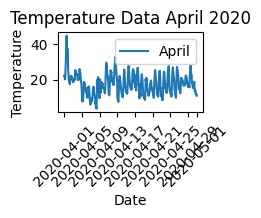

In [295]:
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2020')
plt.legend()
plt.xticks(rotation=45)

Plot data May

(array([18383., 18387., 18391., 18395., 18399., 18403., 18407., 18411.,
        18414.]),
 [Text(18383.0, 0, '2020-05-01'),
  Text(18387.0, 0, '2020-05-05'),
  Text(18391.0, 0, '2020-05-09'),
  Text(18395.0, 0, '2020-05-13'),
  Text(18399.0, 0, '2020-05-17'),
  Text(18403.0, 0, '2020-05-21'),
  Text(18407.0, 0, '2020-05-25'),
  Text(18411.0, 0, '2020-05-29'),
  Text(18414.0, 0, '2020-06-01')])

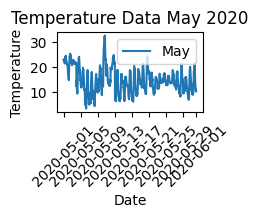

In [296]:
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2020')
plt.legend()
plt.xticks(rotation=45)

Plot data June

(array([18414., 18418., 18422., 18426., 18430., 18434., 18438., 18442.,
        18444.]),
 [Text(18414.0, 0, '2020-06-01'),
  Text(18418.0, 0, '2020-06-05'),
  Text(18422.0, 0, '2020-06-09'),
  Text(18426.0, 0, '2020-06-13'),
  Text(18430.0, 0, '2020-06-17'),
  Text(18434.0, 0, '2020-06-21'),
  Text(18438.0, 0, '2020-06-25'),
  Text(18442.0, 0, '2020-06-29'),
  Text(18444.0, 0, '2020-07-01')])

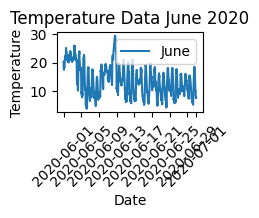

In [297]:
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2020')
plt.legend()
plt.xticks(rotation=45)

Plot data July

(array([18444., 18448., 18452., 18456., 18460., 18464., 18468., 18472.,
        18475.]),
 [Text(18444.0, 0, '2020-07-01'),
  Text(18448.0, 0, '2020-07-05'),
  Text(18452.0, 0, '2020-07-09'),
  Text(18456.0, 0, '2020-07-13'),
  Text(18460.0, 0, '2020-07-17'),
  Text(18464.0, 0, '2020-07-21'),
  Text(18468.0, 0, '2020-07-25'),
  Text(18472.0, 0, '2020-07-29'),
  Text(18475.0, 0, '2020-08-01')])

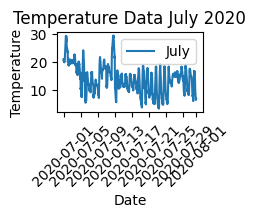

In [298]:
plt.subplot(4, 3, 7)  # 3  rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2020')
plt.legend()
plt.xticks(rotation=45)

Plot data August

(array([18475., 18479., 18483., 18487., 18491., 18495., 18499., 18503.,
        18506.]),
 [Text(18475.0, 0, '2020-08-01'),
  Text(18479.0, 0, '2020-08-05'),
  Text(18483.0, 0, '2020-08-09'),
  Text(18487.0, 0, '2020-08-13'),
  Text(18491.0, 0, '2020-08-17'),
  Text(18495.0, 0, '2020-08-21'),
  Text(18499.0, 0, '2020-08-25'),
  Text(18503.0, 0, '2020-08-29'),
  Text(18506.0, 0, '2020-09-01')])

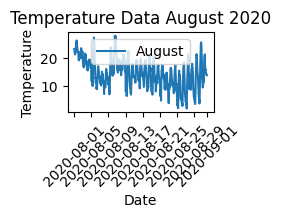

In [299]:
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2020')
plt.legend()
plt.xticks(rotation=45)

Plot data September

(array([18506., 18510., 18514., 18518., 18522., 18526., 18530., 18534.,
        18536.]),
 [Text(18506.0, 0, '2020-09-01'),
  Text(18510.0, 0, '2020-09-05'),
  Text(18514.0, 0, '2020-09-09'),
  Text(18518.0, 0, '2020-09-13'),
  Text(18522.0, 0, '2020-09-17'),
  Text(18526.0, 0, '2020-09-21'),
  Text(18530.0, 0, '2020-09-25'),
  Text(18534.0, 0, '2020-09-29'),
  Text(18536.0, 0, '2020-10-01')])

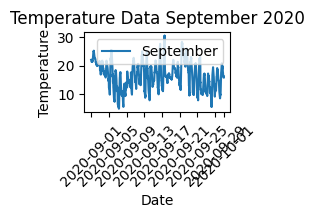

In [300]:
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2020')
plt.legend()
plt.xticks(rotation=45)

Plot data October

(array([18536., 18540., 18544., 18548., 18552., 18556., 18560., 18564.,
        18567.]),
 [Text(18536.0, 0, '2020-10-01'),
  Text(18540.0, 0, '2020-10-05'),
  Text(18544.0, 0, '2020-10-09'),
  Text(18548.0, 0, '2020-10-13'),
  Text(18552.0, 0, '2020-10-17'),
  Text(18556.0, 0, '2020-10-21'),
  Text(18560.0, 0, '2020-10-25'),
  Text(18564.0, 0, '2020-10-29'),
  Text(18567.0, 0, '2020-11-01')])

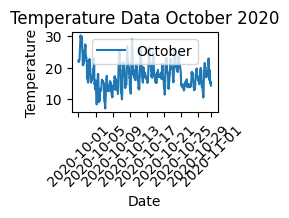

In [301]:
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2020')
plt.legend()
plt.xticks(rotation=45)

Plot data November

(array([18567., 18571., 18575., 18579., 18583., 18587., 18591., 18595.,
        18597.]),
 [Text(18567.0, 0, '2020-11-01'),
  Text(18571.0, 0, '2020-11-05'),
  Text(18575.0, 0, '2020-11-09'),
  Text(18579.0, 0, '2020-11-13'),
  Text(18583.0, 0, '2020-11-17'),
  Text(18587.0, 0, '2020-11-21'),
  Text(18591.0, 0, '2020-11-25'),
  Text(18595.0, 0, '2020-11-29'),
  Text(18597.0, 0, '2020-12-01')])

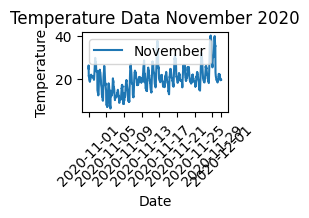

In [302]:
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2020')
plt.legend()
plt.xticks(rotation=45)

Plot data December

(array([18597., 18601., 18605., 18609., 18613., 18617., 18621., 18625.,
        18628.]),
 [Text(18597.0, 0, '2020-12-01'),
  Text(18601.0, 0, '2020-12-05'),
  Text(18605.0, 0, '2020-12-09'),
  Text(18609.0, 0, '2020-12-13'),
  Text(18613.0, 0, '2020-12-17'),
  Text(18617.0, 0, '2020-12-21'),
  Text(18621.0, 0, '2020-12-25'),
  Text(18625.0, 0, '2020-12-29'),
  Text(18628.0, 0, '2021-01-01')])

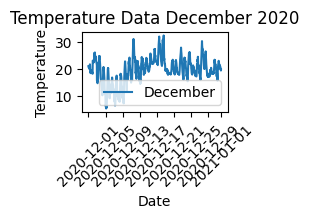

In [303]:
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2020')
plt.legend()
plt.xticks(rotation=45)

In [304]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

<ipython-input-305-6ee4c27114f1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


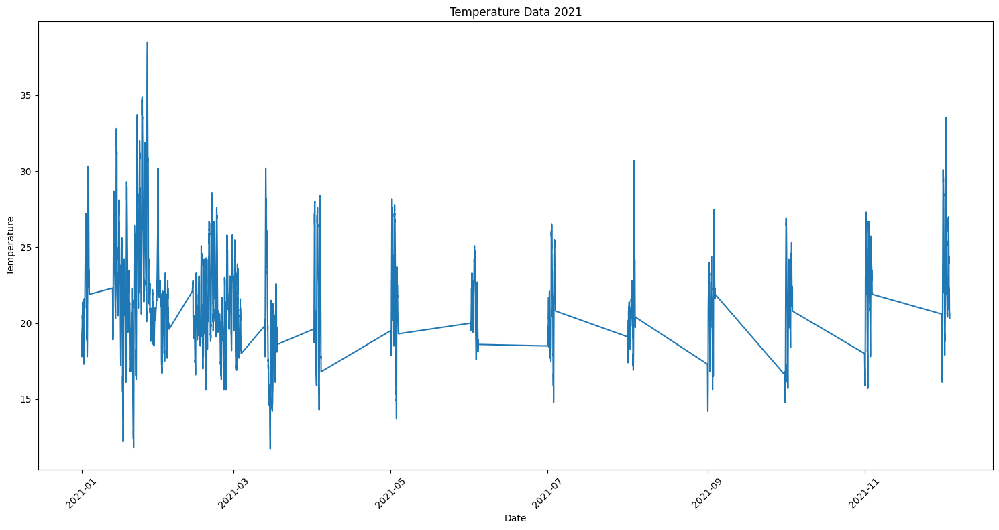

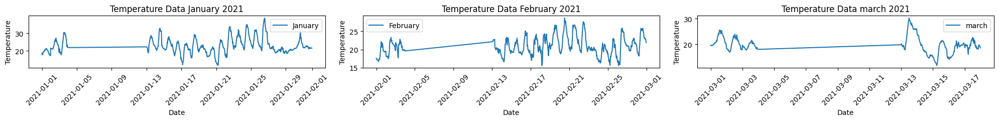

In [305]:

#### Plot Temperature 2021

# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')
# Data filter only for  January 2010
data_2021 = temp_clean[(temp_clean['DATETIME'].dt.year == 2021)]
data_2021 = data_2021.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2021['DATETIME'], data_2021['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2021')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()
import matplotlib.pyplot as plt
import pandas as pd
# Data filter only for  2021
data_2021 = temp_clean[temp_clean['DATETIME'].dt.year == 2021]
# Separate data by month
january_data = data_2021[data_2021['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2021[data_2021['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2021[data_2021['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
# Create manual subplots
plt.figure(figsize=(20, 8))
# Plot data January
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2021')
plt.legend()
plt.xticks(rotation=45)
# Plot data February
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2021')
plt.legend()
plt.xticks(rotation=45)
# Plot data march
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data march 2021')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
## Explore Data

In [306]:

"""We will try to change the data we have into 3 parts,
- Daily average
- Weekly average
- Monthly average`
"""

'We will try to change the data we have into 3 parts,\n- Daily average\n- Weekly average\n- Monthly average`\n'

In [307]:
temp_clean.isnull().sum()

LOCATION       0
DATETIME       0
TEMPERATURE    0
dtype: int64

In [308]:
temp_clean

,LOCATION,DATETIME,TEMPERATURE
0,Bankstown,2010-01-01 00:00:00,23.1
2,Bankstown,2010-01-01 00:30:00,22.9
4,Bankstown,2010-01-01 01:00:00,22.6
5,Bankstown,2010-01-01 01:30:00,22.5
6,Bankstown,2010-01-01 02:00:00,22.5
...,...,...,...
220319,Bankstown,2021-03-17 22:00:00,19.7
220320,Bankstown,2021-03-17 22:30:00,19.5
220321,Bankstown,2021-03-17 23:00:00,19.1
220323,Bankstown,2021-03-17 23:30:00,18.8


Convert DATETIME column to datetime type

In [309]:
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')
temp_clean.tail()

<ipython-input-309-79a5651cbffd>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


,LOCATION,DATETIME,TEMPERATURE
220319,Bankstown,2021-03-17 22:00:00,19.7
220320,Bankstown,2021-03-17 22:30:00,19.5
220321,Bankstown,2021-03-17 23:00:00,19.1
220323,Bankstown,2021-03-17 23:30:00,18.8
220325,Bankstown,2021-03-18 00:00:00,18.6


Save the daily_avg_temp_var variable into a CSV file

In [310]:
temp_clean.to_csv('TEMP_CLEAN_PLIS.csv', header=True, index=True)

Calculate the average temperature per day using GroupBy and Mean

In [311]:
daily_avg_temp = temp_clean.groupby(temp_clean['DATETIME'].dt.date)['TEMPERATURE'].mean()
daily_avg_temp

DATETIME
2010-01-01    25.185417
2010-01-02    24.461702
2010-01-03    18.737500
2010-01-04    19.191489
2010-01-05    15.912821
                ...    
2021-11-02    21.970833
2021-11-03    22.175000
2021-12-01    23.850000
2021-12-02    24.556250
2021-12-03    22.650000
Name: TEMPERATURE, Length: 4092, dtype: float64

Convert DATETIME column to datetime type

In [312]:
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')

<ipython-input-312-af5b2893390f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%d/%m/%Y %H:%M')


Calculate the average temperature per day

In [313]:
monthly_avg_temp = temp_clean.resample('M', on='DATETIME').mean()

<ipython-input-313-51d15d439ba5>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  monthly_avg_temp = temp_clean.resample('M', on='DATETIME').mean()


In [314]:
print(monthly_avg_temp)

            TEMPERATURE
DATETIME               
2010-01-31    20.868008
2010-02-28    20.218907
2010-03-31    19.828286
2010-04-30    17.593856
2010-05-31    15.323485
...                 ...
2021-08-31    21.104167
2021-09-30    20.999306
2021-10-31    21.084722
2021-11-30    22.118056
2021-12-31    23.685417

[144 rows x 1 columns]



## Demand Dataset
### Import Package


Import Package

In [315]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import pandas as pd
import dateutil.easter as ea
from statsmodels.tsa.seasonal import MSTL
from sklearn.cross_decomposition import CCA
from sklearn.preprocessing import StandardScaler

In [316]:

### Input Data

from google.colab import drive
drive.mount('/content/drive')
data_demand_nsw = pd.read_csv('/content/drive/MyDrive/NSW/totaldemand_nsw.csv')
data_demand_nsw['DATETIME'] = pd.to_datetime(data_demand_nsw['DATETIME'])
data_demand_nsw.head()
## Data Preprocessing

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,DATETIME,TOTALDEMAND,REGIONID
0,2010-01-01 00:00:00,8038.00,NSW1
1,2010-01-01 00:30:00,7809.31,NSW1
2,2010-01-01 01:00:00,7483.69,NSW1
3,2010-01-01 01:30:00,7117.23,NSW1
4,2010-01-01 02:00:00,6812.03,NSW1


## Check Missing Values

In [317]:
miss_value = data_demand_nsw.isnull().sum()
print(miss_value)

DATETIME       0
TOTALDEMAND    0
REGIONID       0
dtype: int64





it can be seen that in the demand dataset there are no missing values from each column

## Duplicate & Abnormal data check
The data was checked because this data was obtained once every 30 minutes every day. Therefore, if there is data whose timestamp is not a multiple of 30 minutes, the data row will be deleted and a duplicate check will also be carried out on this.


In [318]:
df2 = pd.DataFrame(data_demand_nsw)
df2

,DATETIME,TOTALDEMAND,REGIONID
0,2010-01-01 00:00:00,8038.00,NSW1
1,2010-01-01 00:30:00,7809.31,NSW1
2,2010-01-01 01:00:00,7483.69,NSW1
3,2010-01-01 01:30:00,7117.23,NSW1
4,2010-01-01 02:00:00,6812.03,NSW1
...,...,...,...
196508,2021-03-17 22:00:00,7419.77,NSW1
196509,2021-03-17 22:30:00,7417.91,NSW1
196510,2021-03-17 23:00:00,7287.32,NSW1
196511,2021-03-17 23:30:00,7172.39,NSW1


In [319]:
import pandas as pd

Convert DATETIME column to datetime type

In [320]:
data_demand_nsw['DATETIME'] = pd.to_datetime(data_demand_nsw['DATETIME'], format='%d/%m/%Y %H:%M')

Calculate the time difference between data entries

In [321]:
data_demand_nsw['TIME_DIFF'] = data_demand_nsw['DATETIME'].diff().dt.total_seconds()

Determine the threshold for the time difference that is considered abnormal

In [322]:
threshold = 1800  # 1800 seconds = 30 minutes

Check if the time difference exceeds the threshold or is not a multiple of 30 minutes

In [323]:
abnormal_indices = data_demand_nsw[(data_demand_nsw['TIME_DIFF'] != threshold) | (data_demand_nsw['DATETIME'].dt.minute % 30 != 0)].index

Update timestamp values and abnormal demand values

In [324]:
for idx in abnormal_indices:
    if idx > 0 and data_demand_nsw.loc[idx, 'DATETIME'].minute % 30 != 0:
        prev_timestamp = data_demand_nsw.loc[idx-1, 'DATETIME']  # Previous timestamp
        prev_demand = data_demand_nsw.loc[idx-1, 'TEMPERATURE']  # Previous demand value
        data_demand_nsw.loc[idx, 'DATETIME'] = prev_timestamp
        data_demand_nsw.loc[idx, 'TEMPERATURE'] = prev_demand

Delete the TIME_DIFF column because it is no longer needed

In [325]:
data_demand_nsw = data_demand_nsw.drop(columns=['TIME_DIFF'])

Remove duplicate data based on LOCATION, DATETIME, and TEMPERATURE columns

In [326]:
demand_clean = data_demand_nsw.drop_duplicates(subset=['TOTALDEMAND', 'DATETIME', 'REGIONID'])
demand_clean.tail()

,DATETIME,TOTALDEMAND,REGIONID
196508,2021-03-17 22:00:00,7419.77,NSW1
196509,2021-03-17 22:30:00,7417.91,NSW1
196510,2021-03-17 23:00:00,7287.32,NSW1
196511,2021-03-17 23:30:00,7172.39,NSW1
196512,2021-03-18 00:00:00,7094.51,NSW1


Checking the amount of data before and after deleting duplicate data

Data Before Deletion

In [327]:
print("Demand Data Before Deletion:", len(data_demand_nsw))

Demand Data Before Deletion: 196513


Data After Deleting

In [328]:
print("Demand Data After Deleting:", len(demand_clean))

Demand Data After Deleting: 196513



It can be seen from the comparison results above, obtained after checking timestamps and duplications, that no rows of data were deleted for the demand dataset.
### Descriptive Analytics


In [329]:
stat_desk_demand = data_demand_nsw.describe()
stat_desk2_demand = demand_clean.describe()
combined_desk_demand = pd.concat([stat_desk_demand, stat_desk2_demand], axis=1)
combined_desk_demand.columns = ['Before Preprocessing', "After Preprocessing"]
print(combined_desk_demand)

       Before Preprocessing  After Preprocessing
count         196513.000000        196513.000000
mean            8113.145859          8113.145859
std             1299.532774          1299.532774
min             5074.630000          5074.630000
25%             7150.070000          7150.070000
50%             8053.230000          8053.230000
75%             8958.550000          8958.550000
max            14579.860000         14579.860000



The descriptive statistical results above were obtained, which were divided into before preprocessing and after preprocessing. There is no difference at all, the amount of data to be analyzed is 196,513 with an average of 8,113,146. The minimum and maximum values â€‹â€‹of this data are 5,074.63 and 14,579.86.
### Data Visualization


Box plot of temperature data

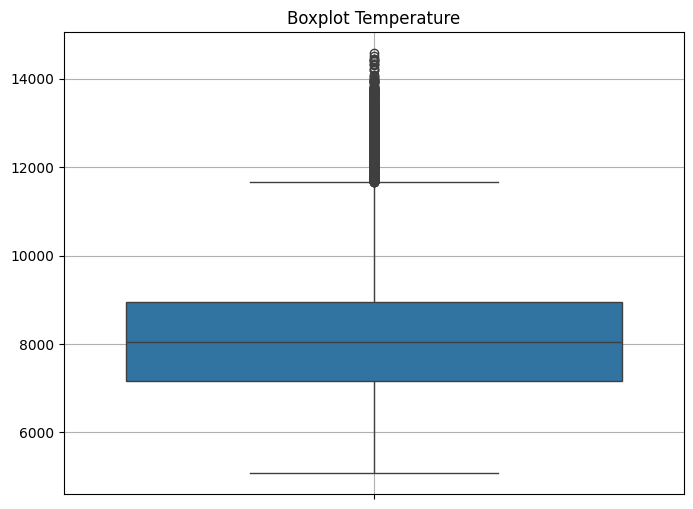

In [330]:
plt.figure(figsize=(8, 6))
sns.boxplot(y='TOTALDEMAND', data=demand_clean)
plt.ylabel('')
plt.title('Boxplot Temperature')
plt.grid(True)
plt.show()

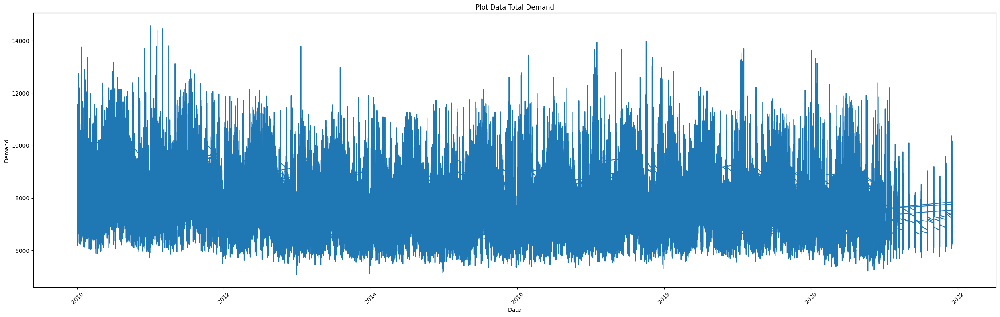

In [331]:
plt.figure(figsize=(25, 8))
plt.plot(demand_clean['DATETIME'], demand_clean['TOTALDEMAND'])#, marker='o')
plt.xlabel('Date')
plt.ylabel('Demand')
plt.title('Plot Data Total Demand')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Obtained above, plot the demand data from January 2010 to December 2021 in the form of data per half hour. Visually, it looks like there is seasonality in the data, where fluctuations tend to recur in each period. Next, to make it clearer, a plot is made over an annual period.
####


Convert DATETIME column to datetime type

In [332]:
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%d/%m/%Y %H:%M')

Data filter only for  January 2010

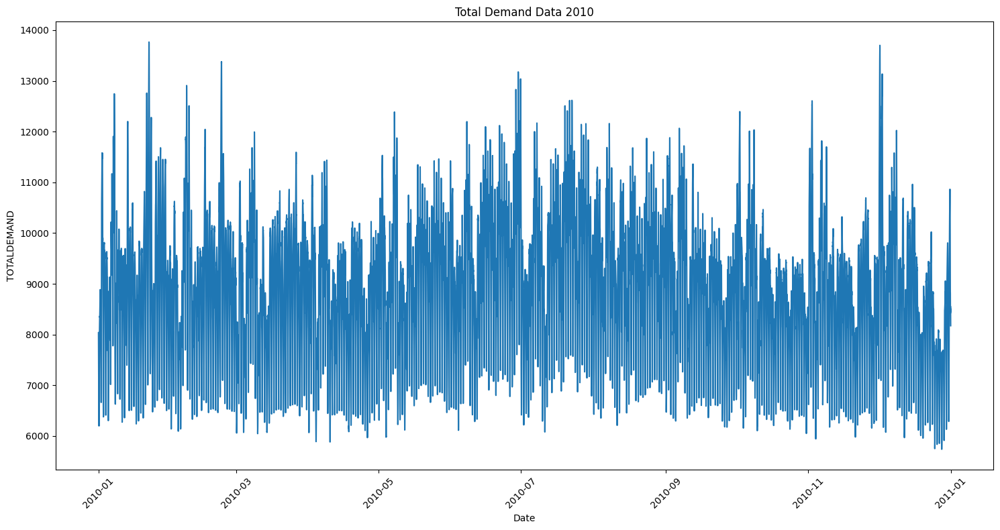

In [333]:
data_2010 = demand_clean[(demand_clean['DATETIME'].dt.year == 2010)]
data_2010 = data_2010.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2010['DATETIME'], data_2010['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2010')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

In [334]:
import matplotlib.pyplot as plt
import pandas as pd

Data filter only for 2010

In [335]:
data_2010 = demand_clean[demand_clean['DATETIME'].dt.year == 2010]

Separate data by month

In [336]:
january_data = data_2010[data_2010['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2010[data_2010['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2010[data_2010['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2010[data_2010['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2010[data_2010['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2010[data_2010['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2010[data_2010['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2010[data_2010['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2010[data_2010['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2010[data_2010['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2010[data_2010['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2010[data_2010['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

Create manual subplots

In [337]:
plt.figure(figsize=(20, 8))

<Figure size 2000x800 with 0 Axes>

<Figure size 2000x800 with 0 Axes>

Plot January data

(array([14610., 14614., 14618., 14622., 14626., 14630., 14634., 14638.,
        14641.]),
 [Text(14610.0, 0, '2010-01-01'),
  Text(14614.0, 0, '2010-01-05'),
  Text(14618.0, 0, '2010-01-09'),
  Text(14622.0, 0, '2010-01-13'),
  Text(14626.0, 0, '2010-01-17'),
  Text(14630.0, 0, '2010-01-21'),
  Text(14634.0, 0, '2010-01-25'),
  Text(14638.0, 0, '2010-01-29'),
  Text(14641.0, 0, '2010-02-01')])

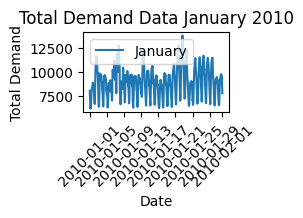

In [338]:
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2010')
plt.legend()
plt.xticks(rotation=45)

Plot February data

(array([14641., 14645., 14649., 14653., 14657., 14661., 14665., 14669.]),
 [Text(14641.0, 0, '2010-02-01'),
  Text(14645.0, 0, '2010-02-05'),
  Text(14649.0, 0, '2010-02-09'),
  Text(14653.0, 0, '2010-02-13'),
  Text(14657.0, 0, '2010-02-17'),
  Text(14661.0, 0, '2010-02-21'),
  Text(14665.0, 0, '2010-02-25'),
  Text(14669.0, 0, '2010-03-01')])

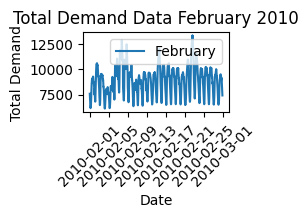

In [339]:
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2010')
plt.legend()
plt.xticks(rotation=45)

March data plot

(array([14669., 14673., 14677., 14681., 14685., 14689., 14693., 14697.,
        14700.]),
 [Text(14669.0, 0, '2010-03-01'),
  Text(14673.0, 0, '2010-03-05'),
  Text(14677.0, 0, '2010-03-09'),
  Text(14681.0, 0, '2010-03-13'),
  Text(14685.0, 0, '2010-03-17'),
  Text(14689.0, 0, '2010-03-21'),
  Text(14693.0, 0, '2010-03-25'),
  Text(14697.0, 0, '2010-03-29'),
  Text(14700.0, 0, '2010-04-01')])

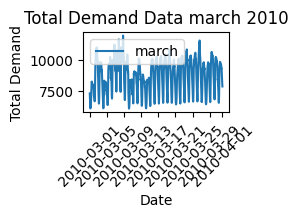

In [340]:
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2010')
plt.legend()
plt.xticks(rotation=45)

Plot April data

(array([14700., 14704., 14708., 14712., 14716., 14720., 14724., 14728.,
        14730.]),
 [Text(14700.0, 0, '2010-04-01'),
  Text(14704.0, 0, '2010-04-05'),
  Text(14708.0, 0, '2010-04-09'),
  Text(14712.0, 0, '2010-04-13'),
  Text(14716.0, 0, '2010-04-17'),
  Text(14720.0, 0, '2010-04-21'),
  Text(14724.0, 0, '2010-04-25'),
  Text(14728.0, 0, '2010-04-29'),
  Text(14730.0, 0, '2010-05-01')])

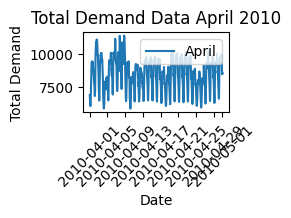

In [341]:
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2010')
plt.legend()
plt.xticks(rotation=45)

Plot May data

(array([14730., 14734., 14738., 14742., 14746., 14750., 14754., 14758.,
        14761.]),
 [Text(14730.0, 0, '2010-05-01'),
  Text(14734.0, 0, '2010-05-05'),
  Text(14738.0, 0, '2010-05-09'),
  Text(14742.0, 0, '2010-05-13'),
  Text(14746.0, 0, '2010-05-17'),
  Text(14750.0, 0, '2010-05-21'),
  Text(14754.0, 0, '2010-05-25'),
  Text(14758.0, 0, '2010-05-29'),
  Text(14761.0, 0, '2010-06-01')])

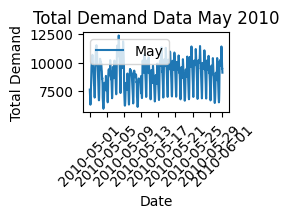

In [342]:
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2010')
plt.legend()
plt.xticks(rotation=45)

Plot May data

(array([14761., 14765., 14769., 14773., 14777., 14781., 14785., 14789.,
        14791.]),
 [Text(14761.0, 0, '2010-06-01'),
  Text(14765.0, 0, '2010-06-05'),
  Text(14769.0, 0, '2010-06-09'),
  Text(14773.0, 0, '2010-06-13'),
  Text(14777.0, 0, '2010-06-17'),
  Text(14781.0, 0, '2010-06-21'),
  Text(14785.0, 0, '2010-06-25'),
  Text(14789.0, 0, '2010-06-29'),
  Text(14791.0, 0, '2010-07-01')])

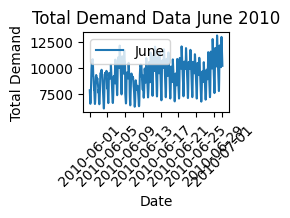

In [343]:
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2010')
plt.legend()
plt.xticks(rotation=45)

Plot May data

(array([14791., 14795., 14799., 14803., 14807., 14811., 14815., 14819.,
        14822.]),
 [Text(14791.0, 0, '2010-07-01'),
  Text(14795.0, 0, '2010-07-05'),
  Text(14799.0, 0, '2010-07-09'),
  Text(14803.0, 0, '2010-07-13'),
  Text(14807.0, 0, '2010-07-17'),
  Text(14811.0, 0, '2010-07-21'),
  Text(14815.0, 0, '2010-07-25'),
  Text(14819.0, 0, '2010-07-29'),
  Text(14822.0, 0, '2010-08-01')])

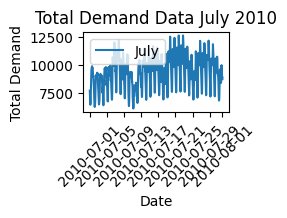

In [344]:
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2010')
plt.legend()
plt.xticks(rotation=45)

August data plot

(array([14822., 14826., 14830., 14834., 14838., 14842., 14846., 14850.,
        14853.]),
 [Text(14822.0, 0, '2010-08-01'),
  Text(14826.0, 0, '2010-08-05'),
  Text(14830.0, 0, '2010-08-09'),
  Text(14834.0, 0, '2010-08-13'),
  Text(14838.0, 0, '2010-08-17'),
  Text(14842.0, 0, '2010-08-21'),
  Text(14846.0, 0, '2010-08-25'),
  Text(14850.0, 0, '2010-08-29'),
  Text(14853.0, 0, '2010-09-01')])

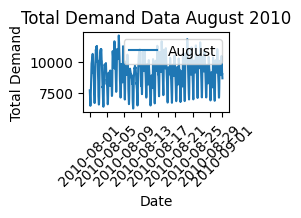

In [345]:
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2010')
plt.legend()
plt.xticks(rotation=45)

September data plot

(array([14853., 14857., 14861., 14865., 14869., 14873., 14877., 14881.,
        14883.]),
 [Text(14853.0, 0, '2010-09-01'),
  Text(14857.0, 0, '2010-09-05'),
  Text(14861.0, 0, '2010-09-09'),
  Text(14865.0, 0, '2010-09-13'),
  Text(14869.0, 0, '2010-09-17'),
  Text(14873.0, 0, '2010-09-21'),
  Text(14877.0, 0, '2010-09-25'),
  Text(14881.0, 0, '2010-09-29'),
  Text(14883.0, 0, '2010-10-01')])

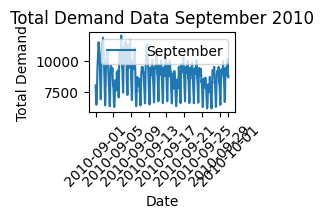

In [346]:
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2010')
plt.legend()
plt.xticks(rotation=45)

October data plot

(array([14883., 14887., 14891., 14895., 14899., 14903., 14907., 14911.,
        14914.]),
 [Text(14883.0, 0, '2010-10-01'),
  Text(14887.0, 0, '2010-10-05'),
  Text(14891.0, 0, '2010-10-09'),
  Text(14895.0, 0, '2010-10-13'),
  Text(14899.0, 0, '2010-10-17'),
  Text(14903.0, 0, '2010-10-21'),
  Text(14907.0, 0, '2010-10-25'),
  Text(14911.0, 0, '2010-10-29'),
  Text(14914.0, 0, '2010-11-01')])

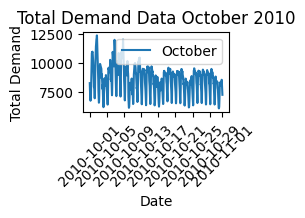

In [347]:
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2010')
plt.legend()
plt.xticks(rotation=45)

Plot November data

(array([14914., 14918., 14922., 14926., 14930., 14934., 14938., 14942.,
        14944.]),
 [Text(14914.0, 0, '2010-11-01'),
  Text(14918.0, 0, '2010-11-05'),
  Text(14922.0, 0, '2010-11-09'),
  Text(14926.0, 0, '2010-11-13'),
  Text(14930.0, 0, '2010-11-17'),
  Text(14934.0, 0, '2010-11-21'),
  Text(14938.0, 0, '2010-11-25'),
  Text(14942.0, 0, '2010-11-29'),
  Text(14944.0, 0, '2010-12-01')])

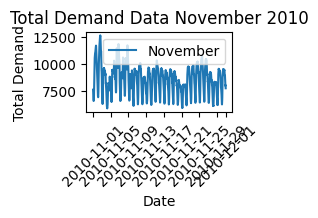

In [348]:
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2010')
plt.legend()
plt.xticks(rotation=45)

Plot December data

(array([14944., 14948., 14952., 14956., 14960., 14964., 14968., 14972.,
        14975.]),
 [Text(14944.0, 0, '2010-12-01'),
  Text(14948.0, 0, '2010-12-05'),
  Text(14952.0, 0, '2010-12-09'),
  Text(14956.0, 0, '2010-12-13'),
  Text(14960.0, 0, '2010-12-17'),
  Text(14964.0, 0, '2010-12-21'),
  Text(14968.0, 0, '2010-12-25'),
  Text(14972.0, 0, '2010-12-29'),
  Text(14975.0, 0, '2011-01-01')])

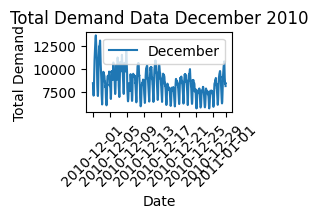

In [349]:
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2010')
plt.legend()
plt.xticks(rotation=45)

In [350]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

Convert DATETIME column to datetime type

In [351]:
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%d/%m/%Y %H:%M')

Data filter only for January 2010

In [352]:
data_2012 = demand_clean[(demand_clean['DATETIME'].dt.year == 2012)]
data_2012 = data_2012.sort_values(by='DATETIME')

Time series plots

(array([15340., 15400., 15461., 15522., 15584., 15645., 15706.]),
 [Text(15340.0, 0, '2012-01'),
  Text(15400.0, 0, '2012-03'),
  Text(15461.0, 0, '2012-05'),
  Text(15522.0, 0, '2012-07'),
  Text(15584.0, 0, '2012-09'),
  Text(15645.0, 0, '2012-11'),
  Text(15706.0, 0, '2013-01')])

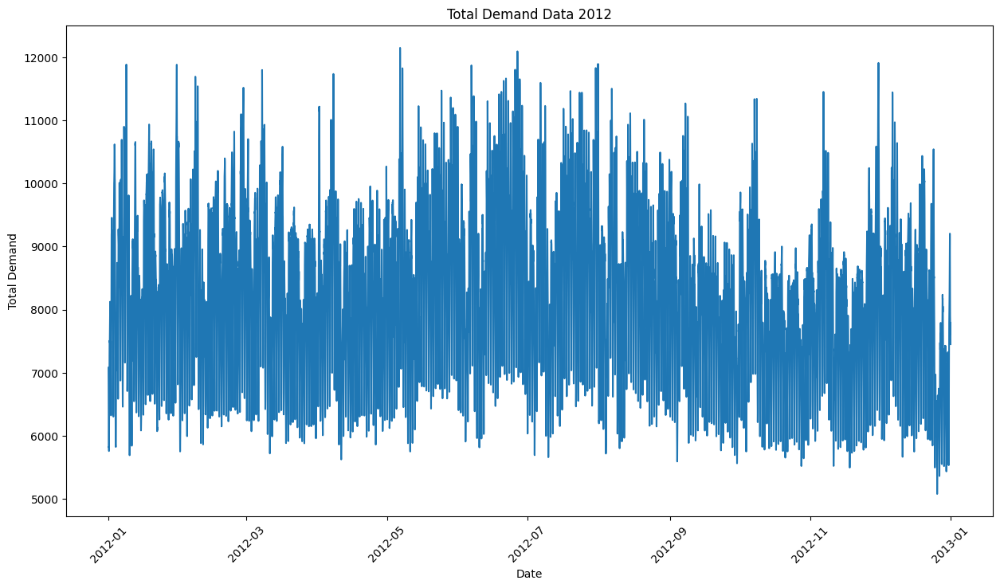

In [353]:
plt.figure(figsize=(15, 8))
plt.plot(data_2012['DATETIME'], data_2012['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data 2012')
plt.xticks(rotation=45)

lt.grid(True)

In [354]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

In [355]:
import matplotlib.pyplot as plt
import pandas as pd

Data filter only for 2012

In [356]:
data_2012 = demand_clean[demand_clean['DATETIME'].dt.year == 2012]

In [357]:
january_data = data_2012[data_2012['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2012[data_2012['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2012[data_2012['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2012[data_2012['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2012[data_2012['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2012[data_2012['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2012[data_2012['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2012[data_2012['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2012[data_2012['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2012[data_2012['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2012[data_2012['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2012[data_2012['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

Create manual subplots

In [358]:
plt.figure(figsize=(20, 8))

<Figure size 2000x800 with 0 Axes>

<Figure size 2000x800 with 0 Axes>

Plot January data

(array([15340., 15344., 15348., 15352., 15356., 15360., 15364., 15368.,
        15371.]),
 [Text(15340.0, 0, '2012-01-01'),
  Text(15344.0, 0, '2012-01-05'),
  Text(15348.0, 0, '2012-01-09'),
  Text(15352.0, 0, '2012-01-13'),
  Text(15356.0, 0, '2012-01-17'),
  Text(15360.0, 0, '2012-01-21'),
  Text(15364.0, 0, '2012-01-25'),
  Text(15368.0, 0, '2012-01-29'),
  Text(15371.0, 0, '2012-02-01')])

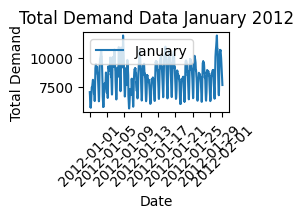

In [359]:
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2012')
plt.legend()
plt.xticks(rotation=45)

Plot February data

(array([15371., 15375., 15379., 15383., 15387., 15391., 15395., 15399.,
        15400.]),
 [Text(15371.0, 0, '2012-02-01'),
  Text(15375.0, 0, '2012-02-05'),
  Text(15379.0, 0, '2012-02-09'),
  Text(15383.0, 0, '2012-02-13'),
  Text(15387.0, 0, '2012-02-17'),
  Text(15391.0, 0, '2012-02-21'),
  Text(15395.0, 0, '2012-02-25'),
  Text(15399.0, 0, '2012-02-29'),
  Text(15400.0, 0, '2012-03-01')])

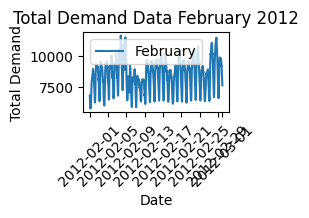

In [360]:
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2012')
plt.legend()
plt.xticks(rotation=45)

Plot march data

(array([15399., 15400., 15404., 15408., 15412., 15416., 15420., 15424.,
        15428., 15431.]),
 [Text(15399.0, 0, '2012-02-29'),
  Text(15400.0, 0, '2012-03-01'),
  Text(15404.0, 0, '2012-03-05'),
  Text(15408.0, 0, '2012-03-09'),
  Text(15412.0, 0, '2012-03-13'),
  Text(15416.0, 0, '2012-03-17'),
  Text(15420.0, 0, '2012-03-21'),
  Text(15424.0, 0, '2012-03-25'),
  Text(15428.0, 0, '2012-03-29'),
  Text(15431.0, 0, '2012-04-01')])

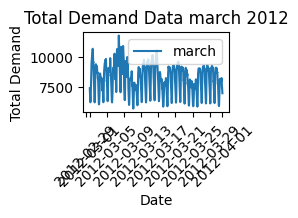

In [361]:
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2012')
plt.legend()
plt.xticks(rotation=45)

Plot April data

(array([15431., 15435., 15439., 15443., 15447., 15451., 15455., 15459.,
        15461.]),
 [Text(15431.0, 0, '2012-04-01'),
  Text(15435.0, 0, '2012-04-05'),
  Text(15439.0, 0, '2012-04-09'),
  Text(15443.0, 0, '2012-04-13'),
  Text(15447.0, 0, '2012-04-17'),
  Text(15451.0, 0, '2012-04-21'),
  Text(15455.0, 0, '2012-04-25'),
  Text(15459.0, 0, '2012-04-29'),
  Text(15461.0, 0, '2012-05-01')])

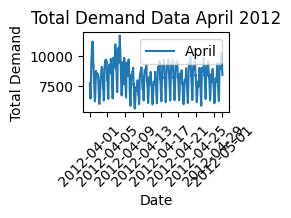

In [362]:
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2012')
plt.legend()
plt.xticks(rotation=45)

Plot May data

(array([15461., 15465., 15469., 15473., 15477., 15481., 15485., 15489.,
        15492.]),
 [Text(15461.0, 0, '2012-05-01'),
  Text(15465.0, 0, '2012-05-05'),
  Text(15469.0, 0, '2012-05-09'),
  Text(15473.0, 0, '2012-05-13'),
  Text(15477.0, 0, '2012-05-17'),
  Text(15481.0, 0, '2012-05-21'),
  Text(15485.0, 0, '2012-05-25'),
  Text(15489.0, 0, '2012-05-29'),
  Text(15492.0, 0, '2012-06-01')])

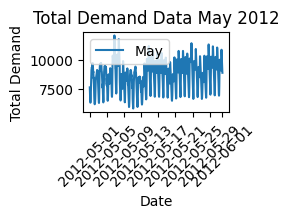

In [363]:
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2012')
plt.legend()
plt.xticks(rotation=45)

Plot June data

(array([15492., 15496., 15500., 15504., 15508., 15512., 15516., 15520.,
        15522.]),
 [Text(15492.0, 0, '2012-06-01'),
  Text(15496.0, 0, '2012-06-05'),
  Text(15500.0, 0, '2012-06-09'),
  Text(15504.0, 0, '2012-06-13'),
  Text(15508.0, 0, '2012-06-17'),
  Text(15512.0, 0, '2012-06-21'),
  Text(15516.0, 0, '2012-06-25'),
  Text(15520.0, 0, '2012-06-29'),
  Text(15522.0, 0, '2012-07-01')])

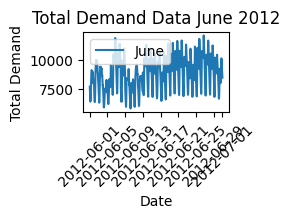

In [364]:
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2012')
plt.legend()
plt.xticks(rotation=45)

Plot July data

(array([15522., 15526., 15530., 15534., 15538., 15542., 15546., 15550.,
        15553.]),
 [Text(15522.0, 0, '2012-07-01'),
  Text(15526.0, 0, '2012-07-05'),
  Text(15530.0, 0, '2012-07-09'),
  Text(15534.0, 0, '2012-07-13'),
  Text(15538.0, 0, '2012-07-17'),
  Text(15542.0, 0, '2012-07-21'),
  Text(15546.0, 0, '2012-07-25'),
  Text(15550.0, 0, '2012-07-29'),
  Text(15553.0, 0, '2012-08-01')])

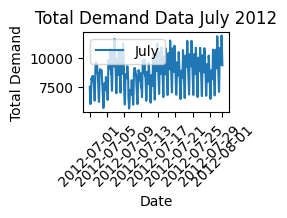

In [365]:
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2012')
plt.legend()
plt.xticks(rotation=45)

Plot August data

(array([15553., 15557., 15561., 15565., 15569., 15573., 15577., 15581.,
        15584.]),
 [Text(15553.0, 0, '2012-08-01'),
  Text(15557.0, 0, '2012-08-05'),
  Text(15561.0, 0, '2012-08-09'),
  Text(15565.0, 0, '2012-08-13'),
  Text(15569.0, 0, '2012-08-17'),
  Text(15573.0, 0, '2012-08-21'),
  Text(15577.0, 0, '2012-08-25'),
  Text(15581.0, 0, '2012-08-29'),
  Text(15584.0, 0, '2012-09-01')])

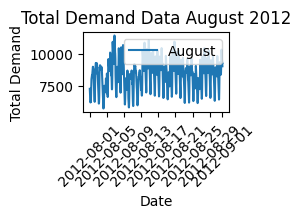

In [366]:
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2012')
plt.legend()
plt.xticks(rotation=45)

Plot September data

(array([15584., 15588., 15592., 15596., 15600., 15604., 15608., 15612.,
        15614.]),
 [Text(15584.0, 0, '2012-09-01'),
  Text(15588.0, 0, '2012-09-05'),
  Text(15592.0, 0, '2012-09-09'),
  Text(15596.0, 0, '2012-09-13'),
  Text(15600.0, 0, '2012-09-17'),
  Text(15604.0, 0, '2012-09-21'),
  Text(15608.0, 0, '2012-09-25'),
  Text(15612.0, 0, '2012-09-29'),
  Text(15614.0, 0, '2012-10-01')])

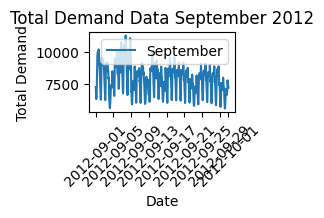

In [367]:
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2012')
plt.legend()
plt.xticks(rotation=45)

Plot October data

(array([15614., 15618., 15622., 15626., 15630., 15634., 15638., 15642.,
        15645.]),
 [Text(15614.0, 0, '2012-10-01'),
  Text(15618.0, 0, '2012-10-05'),
  Text(15622.0, 0, '2012-10-09'),
  Text(15626.0, 0, '2012-10-13'),
  Text(15630.0, 0, '2012-10-17'),
  Text(15634.0, 0, '2012-10-21'),
  Text(15638.0, 0, '2012-10-25'),
  Text(15642.0, 0, '2012-10-29'),
  Text(15645.0, 0, '2012-11-01')])

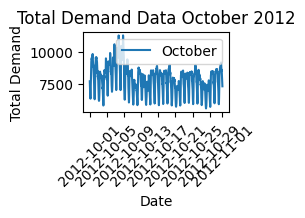

In [368]:
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2012')
plt.legend()
plt.xticks(rotation=45)

Plot November data

(array([15645., 15649., 15653., 15657., 15661., 15665., 15669., 15673.,
        15675.]),
 [Text(15645.0, 0, '2012-11-01'),
  Text(15649.0, 0, '2012-11-05'),
  Text(15653.0, 0, '2012-11-09'),
  Text(15657.0, 0, '2012-11-13'),
  Text(15661.0, 0, '2012-11-17'),
  Text(15665.0, 0, '2012-11-21'),
  Text(15669.0, 0, '2012-11-25'),
  Text(15673.0, 0, '2012-11-29'),
  Text(15675.0, 0, '2012-12-01')])

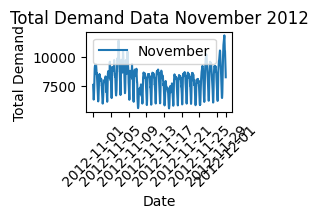

In [369]:
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2012')
plt.legend()
plt.xticks(rotation=45)

Plot December data

(array([15675., 15679., 15683., 15687., 15691., 15695., 15699., 15703.,
        15706.]),
 [Text(15675.0, 0, '2012-12-01'),
  Text(15679.0, 0, '2012-12-05'),
  Text(15683.0, 0, '2012-12-09'),
  Text(15687.0, 0, '2012-12-13'),
  Text(15691.0, 0, '2012-12-17'),
  Text(15695.0, 0, '2012-12-21'),
  Text(15699.0, 0, '2012-12-25'),
  Text(15703.0, 0, '2012-12-29'),
  Text(15706.0, 0, '2013-01-01')])

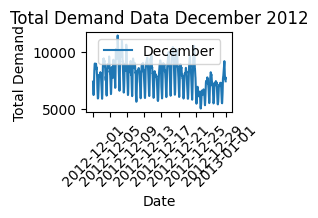

In [370]:
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2012')
plt.legend()
plt.xticks(rotation=45)

In [371]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

Convert DATETIME column to datetime type

In [372]:
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%d/%m/%Y %H:%M')

Data filter only for  January 2010

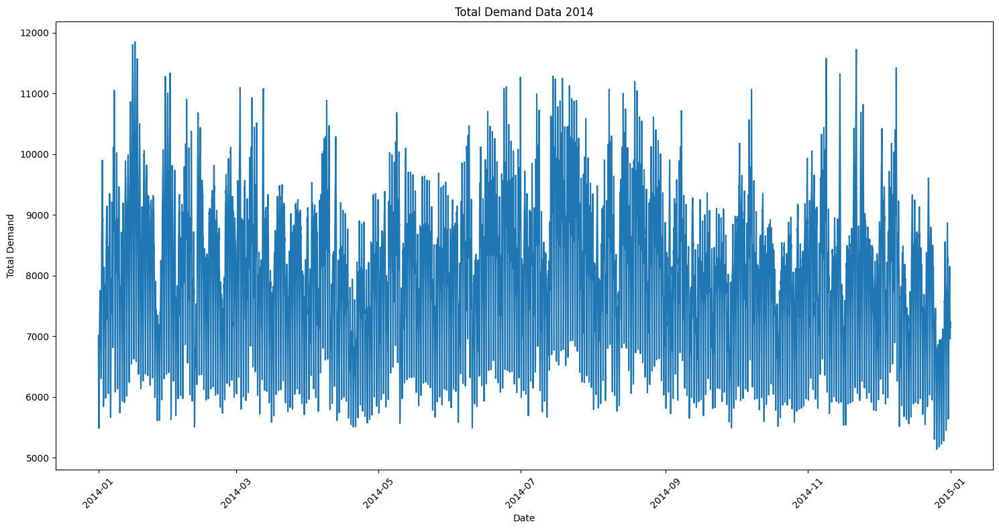

In [373]:
data_2014 = demand_clean[(demand_clean['DATETIME'].dt.year == 2014)]
data_2014 = data_2014.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2014['DATETIME'], data_2014['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data 2014')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

In [374]:
import matplotlib.pyplot as plt
import pandas as pd

Data filter only for  2014

In [375]:
data_2014 = demand_clean[demand_clean['DATETIME'].dt.year == 2014]

Separate data by month

In [376]:
january_data = data_2014[data_2014['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2014[data_2014['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2014[data_2014['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2014[data_2014['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2014[data_2014['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2014[data_2014['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2014[data_2014['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2014[data_2014['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2014[data_2014['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2014[data_2014['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2014[data_2014['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2014[data_2014['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

Create manual subplots

In [377]:
plt.figure(figsize=(20, 8))

<Figure size 2000x800 with 0 Axes>

<Figure size 2000x800 with 0 Axes>

Plot data January

(array([16071., 16075., 16079., 16083., 16087., 16091., 16095., 16099.,
        16102.]),
 [Text(16071.0, 0, '2014-01-01'),
  Text(16075.0, 0, '2014-01-05'),
  Text(16079.0, 0, '2014-01-09'),
  Text(16083.0, 0, '2014-01-13'),
  Text(16087.0, 0, '2014-01-17'),
  Text(16091.0, 0, '2014-01-21'),
  Text(16095.0, 0, '2014-01-25'),
  Text(16099.0, 0, '2014-01-29'),
  Text(16102.0, 0, '2014-02-01')])

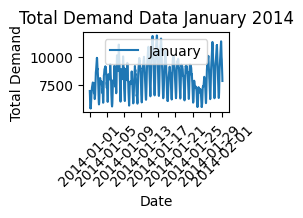

In [378]:
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data February

(array([16102., 16106., 16110., 16114., 16118., 16122., 16126., 16130.]),
 [Text(16102.0, 0, '2014-02-01'),
  Text(16106.0, 0, '2014-02-05'),
  Text(16110.0, 0, '2014-02-09'),
  Text(16114.0, 0, '2014-02-13'),
  Text(16118.0, 0, '2014-02-17'),
  Text(16122.0, 0, '2014-02-21'),
  Text(16126.0, 0, '2014-02-25'),
  Text(16130.0, 0, '2014-03-01')])

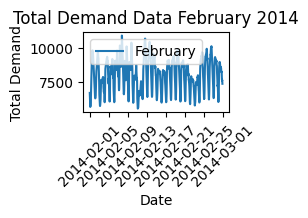

In [379]:
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data march

(array([16130., 16134., 16138., 16142., 16146., 16150., 16154., 16158.,
        16161.]),
 [Text(16130.0, 0, '2014-03-01'),
  Text(16134.0, 0, '2014-03-05'),
  Text(16138.0, 0, '2014-03-09'),
  Text(16142.0, 0, '2014-03-13'),
  Text(16146.0, 0, '2014-03-17'),
  Text(16150.0, 0, '2014-03-21'),
  Text(16154.0, 0, '2014-03-25'),
  Text(16158.0, 0, '2014-03-29'),
  Text(16161.0, 0, '2014-04-01')])

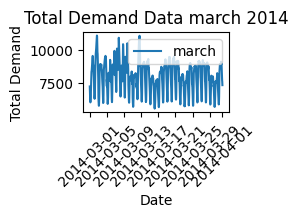

In [380]:
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data April

(array([16161., 16165., 16169., 16173., 16177., 16181., 16185., 16189.,
        16191.]),
 [Text(16161.0, 0, '2014-04-01'),
  Text(16165.0, 0, '2014-04-05'),
  Text(16169.0, 0, '2014-04-09'),
  Text(16173.0, 0, '2014-04-13'),
  Text(16177.0, 0, '2014-04-17'),
  Text(16181.0, 0, '2014-04-21'),
  Text(16185.0, 0, '2014-04-25'),
  Text(16189.0, 0, '2014-04-29'),
  Text(16191.0, 0, '2014-05-01')])

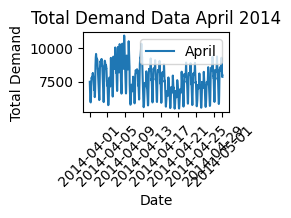

In [381]:
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data May

(array([16191., 16195., 16199., 16203., 16207., 16211., 16215., 16219.,
        16222.]),
 [Text(16191.0, 0, '2014-05-01'),
  Text(16195.0, 0, '2014-05-05'),
  Text(16199.0, 0, '2014-05-09'),
  Text(16203.0, 0, '2014-05-13'),
  Text(16207.0, 0, '2014-05-17'),
  Text(16211.0, 0, '2014-05-21'),
  Text(16215.0, 0, '2014-05-25'),
  Text(16219.0, 0, '2014-05-29'),
  Text(16222.0, 0, '2014-06-01')])

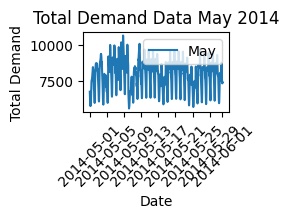

In [382]:
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data June

(array([16222., 16226., 16230., 16234., 16238., 16242., 16246., 16250.,
        16252.]),
 [Text(16222.0, 0, '2014-06-01'),
  Text(16226.0, 0, '2014-06-05'),
  Text(16230.0, 0, '2014-06-09'),
  Text(16234.0, 0, '2014-06-13'),
  Text(16238.0, 0, '2014-06-17'),
  Text(16242.0, 0, '2014-06-21'),
  Text(16246.0, 0, '2014-06-25'),
  Text(16250.0, 0, '2014-06-29'),
  Text(16252.0, 0, '2014-07-01')])

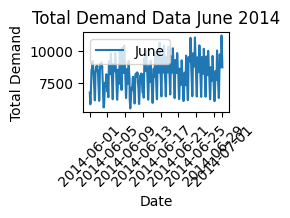

In [383]:
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data July

(array([16252., 16256., 16260., 16264., 16268., 16272., 16276., 16280.,
        16283.]),
 [Text(16252.0, 0, '2014-07-01'),
  Text(16256.0, 0, '2014-07-05'),
  Text(16260.0, 0, '2014-07-09'),
  Text(16264.0, 0, '2014-07-13'),
  Text(16268.0, 0, '2014-07-17'),
  Text(16272.0, 0, '2014-07-21'),
  Text(16276.0, 0, '2014-07-25'),
  Text(16280.0, 0, '2014-07-29'),
  Text(16283.0, 0, '2014-08-01')])

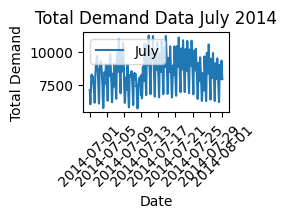

In [384]:
plt.subplot(4, 3, 7)  # 3  rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data August

(array([16283., 16287., 16291., 16295., 16299., 16303., 16307., 16311.,
        16314.]),
 [Text(16283.0, 0, '2014-08-01'),
  Text(16287.0, 0, '2014-08-05'),
  Text(16291.0, 0, '2014-08-09'),
  Text(16295.0, 0, '2014-08-13'),
  Text(16299.0, 0, '2014-08-17'),
  Text(16303.0, 0, '2014-08-21'),
  Text(16307.0, 0, '2014-08-25'),
  Text(16311.0, 0, '2014-08-29'),
  Text(16314.0, 0, '2014-09-01')])

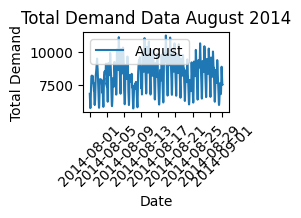

In [385]:
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data September

(array([16314., 16318., 16322., 16326., 16330., 16334., 16338., 16342.,
        16344.]),
 [Text(16314.0, 0, '2014-09-01'),
  Text(16318.0, 0, '2014-09-05'),
  Text(16322.0, 0, '2014-09-09'),
  Text(16326.0, 0, '2014-09-13'),
  Text(16330.0, 0, '2014-09-17'),
  Text(16334.0, 0, '2014-09-21'),
  Text(16338.0, 0, '2014-09-25'),
  Text(16342.0, 0, '2014-09-29'),
  Text(16344.0, 0, '2014-10-01')])

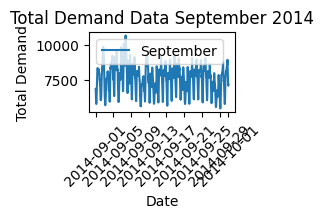

In [386]:
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data October

(array([16344., 16348., 16352., 16356., 16360., 16364., 16368., 16372.,
        16375.]),
 [Text(16344.0, 0, '2014-10-01'),
  Text(16348.0, 0, '2014-10-05'),
  Text(16352.0, 0, '2014-10-09'),
  Text(16356.0, 0, '2014-10-13'),
  Text(16360.0, 0, '2014-10-17'),
  Text(16364.0, 0, '2014-10-21'),
  Text(16368.0, 0, '2014-10-25'),
  Text(16372.0, 0, '2014-10-29'),
  Text(16375.0, 0, '2014-11-01')])

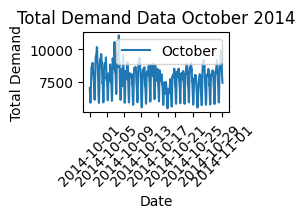

In [387]:
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data November

(array([16375., 16379., 16383., 16387., 16391., 16395., 16399., 16403.,
        16405.]),
 [Text(16375.0, 0, '2014-11-01'),
  Text(16379.0, 0, '2014-11-05'),
  Text(16383.0, 0, '2014-11-09'),
  Text(16387.0, 0, '2014-11-13'),
  Text(16391.0, 0, '2014-11-17'),
  Text(16395.0, 0, '2014-11-21'),
  Text(16399.0, 0, '2014-11-25'),
  Text(16403.0, 0, '2014-11-29'),
  Text(16405.0, 0, '2014-12-01')])

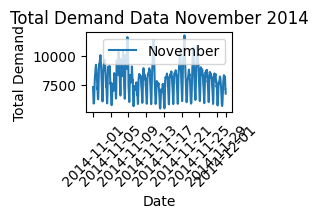

In [388]:
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2014')
plt.legend()
plt.xticks(rotation=45)

Plot data December

(array([16405., 16409., 16413., 16417., 16421., 16425., 16429., 16433.,
        16436.]),
 [Text(16405.0, 0, '2014-12-01'),
  Text(16409.0, 0, '2014-12-05'),
  Text(16413.0, 0, '2014-12-09'),
  Text(16417.0, 0, '2014-12-13'),
  Text(16421.0, 0, '2014-12-17'),
  Text(16425.0, 0, '2014-12-21'),
  Text(16429.0, 0, '2014-12-25'),
  Text(16433.0, 0, '2014-12-29'),
  Text(16436.0, 0, '2015-01-01')])

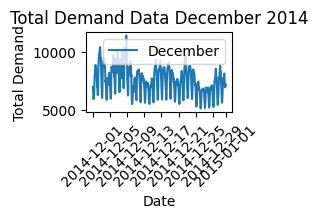

In [389]:
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2014')
plt.legend()
plt.xticks(rotation=45)

In [390]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

Convert DATETIME column to datetime type

In [391]:
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%d/%m/%Y %H:%M')

Data filter only for  January 2010

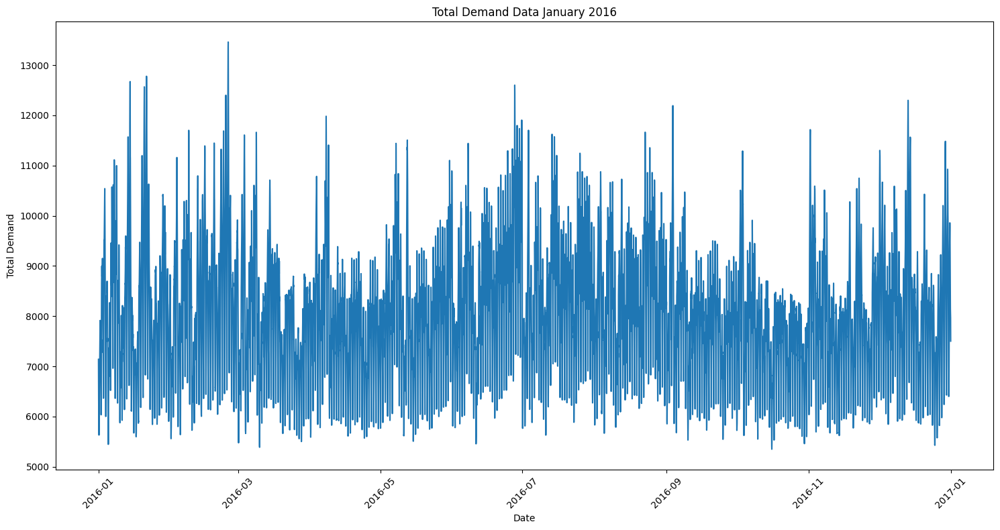

In [392]:
data_2016 = demand_clean[(demand_clean['DATETIME'].dt.year == 2016)]
data_2016 = data_2016.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2016['DATETIME'], data_2016['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2016')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

In [393]:
import matplotlib.pyplot as plt
import pandas as pd

Data filter only for  2016

In [394]:
data_2016 = demand_clean[demand_clean['DATETIME'].dt.year == 2016]

Separate data by month

In [395]:
january_data = data_2016[data_2016['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2016[data_2016['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2016[data_2016['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2016[data_2016['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2016[data_2016['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2016[data_2016['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2016[data_2016['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2016[data_2016['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2016[data_2016['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2016[data_2016['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2016[data_2016['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2016[data_2016['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

Create manual subplots

In [396]:
plt.figure(figsize=(20, 8))

<Figure size 2000x800 with 0 Axes>

<Figure size 2000x800 with 0 Axes>

Plot data January

(array([16801., 16805., 16809., 16813., 16817., 16821., 16825., 16829.,
        16832.]),
 [Text(16801.0, 0, '2016-01-01'),
  Text(16805.0, 0, '2016-01-05'),
  Text(16809.0, 0, '2016-01-09'),
  Text(16813.0, 0, '2016-01-13'),
  Text(16817.0, 0, '2016-01-17'),
  Text(16821.0, 0, '2016-01-21'),
  Text(16825.0, 0, '2016-01-25'),
  Text(16829.0, 0, '2016-01-29'),
  Text(16832.0, 0, '2016-02-01')])

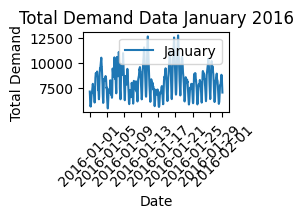

In [397]:
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data February

(array([16832., 16836., 16840., 16844., 16848., 16852., 16856., 16860.,
        16861.]),
 [Text(16832.0, 0, '2016-02-01'),
  Text(16836.0, 0, '2016-02-05'),
  Text(16840.0, 0, '2016-02-09'),
  Text(16844.0, 0, '2016-02-13'),
  Text(16848.0, 0, '2016-02-17'),
  Text(16852.0, 0, '2016-02-21'),
  Text(16856.0, 0, '2016-02-25'),
  Text(16860.0, 0, '2016-02-29'),
  Text(16861.0, 0, '2016-03-01')])

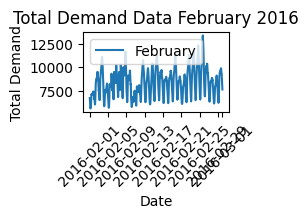

In [398]:
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data march

(array([16860., 16861., 16865., 16869., 16873., 16877., 16881., 16885.,
        16889., 16892.]),
 [Text(16860.0, 0, '2016-02-29'),
  Text(16861.0, 0, '2016-03-01'),
  Text(16865.0, 0, '2016-03-05'),
  Text(16869.0, 0, '2016-03-09'),
  Text(16873.0, 0, '2016-03-13'),
  Text(16877.0, 0, '2016-03-17'),
  Text(16881.0, 0, '2016-03-21'),
  Text(16885.0, 0, '2016-03-25'),
  Text(16889.0, 0, '2016-03-29'),
  Text(16892.0, 0, '2016-04-01')])

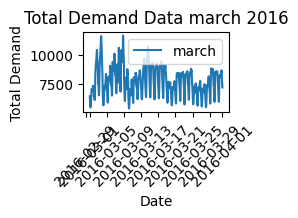

In [399]:
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data April

(array([16892., 16896., 16900., 16904., 16908., 16912., 16916., 16920.,
        16922.]),
 [Text(16892.0, 0, '2016-04-01'),
  Text(16896.0, 0, '2016-04-05'),
  Text(16900.0, 0, '2016-04-09'),
  Text(16904.0, 0, '2016-04-13'),
  Text(16908.0, 0, '2016-04-17'),
  Text(16912.0, 0, '2016-04-21'),
  Text(16916.0, 0, '2016-04-25'),
  Text(16920.0, 0, '2016-04-29'),
  Text(16922.0, 0, '2016-05-01')])

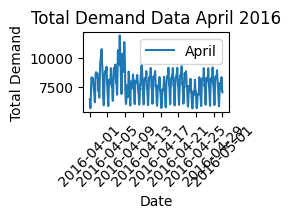

In [400]:
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data May

(array([16922., 16926., 16930., 16934., 16938., 16942., 16946., 16950.,
        16953.]),
 [Text(16922.0, 0, '2016-05-01'),
  Text(16926.0, 0, '2016-05-05'),
  Text(16930.0, 0, '2016-05-09'),
  Text(16934.0, 0, '2016-05-13'),
  Text(16938.0, 0, '2016-05-17'),
  Text(16942.0, 0, '2016-05-21'),
  Text(16946.0, 0, '2016-05-25'),
  Text(16950.0, 0, '2016-05-29'),
  Text(16953.0, 0, '2016-06-01')])

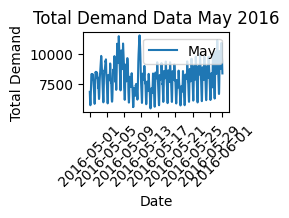

In [401]:
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data June

(array([16953., 16957., 16961., 16965., 16969., 16973., 16977., 16981.,
        16983.]),
 [Text(16953.0, 0, '2016-06-01'),
  Text(16957.0, 0, '2016-06-05'),
  Text(16961.0, 0, '2016-06-09'),
  Text(16965.0, 0, '2016-06-13'),
  Text(16969.0, 0, '2016-06-17'),
  Text(16973.0, 0, '2016-06-21'),
  Text(16977.0, 0, '2016-06-25'),
  Text(16981.0, 0, '2016-06-29'),
  Text(16983.0, 0, '2016-07-01')])

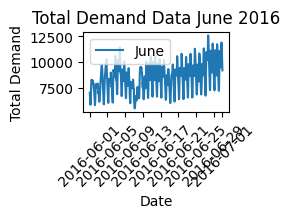

In [402]:
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data July

(array([16983., 16987., 16991., 16995., 16999., 17003., 17007., 17011.,
        17014.]),
 [Text(16983.0, 0, '2016-07-01'),
  Text(16987.0, 0, '2016-07-05'),
  Text(16991.0, 0, '2016-07-09'),
  Text(16995.0, 0, '2016-07-13'),
  Text(16999.0, 0, '2016-07-17'),
  Text(17003.0, 0, '2016-07-21'),
  Text(17007.0, 0, '2016-07-25'),
  Text(17011.0, 0, '2016-07-29'),
  Text(17014.0, 0, '2016-08-01')])

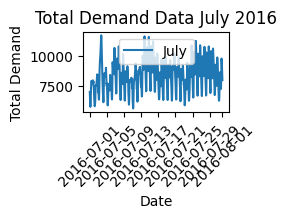

In [403]:
plt.subplot(4, 3, 7)  # 3  rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data August

(array([17014., 17018., 17022., 17026., 17030., 17034., 17038., 17042.,
        17045.]),
 [Text(17014.0, 0, '2016-08-01'),
  Text(17018.0, 0, '2016-08-05'),
  Text(17022.0, 0, '2016-08-09'),
  Text(17026.0, 0, '2016-08-13'),
  Text(17030.0, 0, '2016-08-17'),
  Text(17034.0, 0, '2016-08-21'),
  Text(17038.0, 0, '2016-08-25'),
  Text(17042.0, 0, '2016-08-29'),
  Text(17045.0, 0, '2016-09-01')])

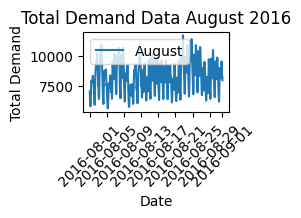

In [404]:
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data September

(array([17045., 17049., 17053., 17057., 17061., 17065., 17069., 17073.,
        17075.]),
 [Text(17045.0, 0, '2016-09-01'),
  Text(17049.0, 0, '2016-09-05'),
  Text(17053.0, 0, '2016-09-09'),
  Text(17057.0, 0, '2016-09-13'),
  Text(17061.0, 0, '2016-09-17'),
  Text(17065.0, 0, '2016-09-21'),
  Text(17069.0, 0, '2016-09-25'),
  Text(17073.0, 0, '2016-09-29'),
  Text(17075.0, 0, '2016-10-01')])

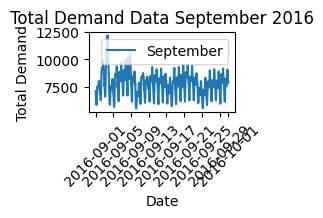

In [405]:
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data October

(array([17075., 17079., 17083., 17087., 17091., 17095., 17099., 17103.,
        17106.]),
 [Text(17075.0, 0, '2016-10-01'),
  Text(17079.0, 0, '2016-10-05'),
  Text(17083.0, 0, '2016-10-09'),
  Text(17087.0, 0, '2016-10-13'),
  Text(17091.0, 0, '2016-10-17'),
  Text(17095.0, 0, '2016-10-21'),
  Text(17099.0, 0, '2016-10-25'),
  Text(17103.0, 0, '2016-10-29'),
  Text(17106.0, 0, '2016-11-01')])

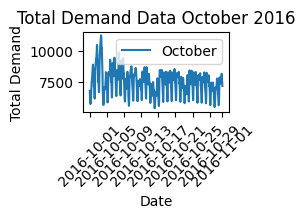

In [406]:
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data November

(array([17106., 17110., 17114., 17118., 17122., 17126., 17130., 17134.,
        17136.]),
 [Text(17106.0, 0, '2016-11-01'),
  Text(17110.0, 0, '2016-11-05'),
  Text(17114.0, 0, '2016-11-09'),
  Text(17118.0, 0, '2016-11-13'),
  Text(17122.0, 0, '2016-11-17'),
  Text(17126.0, 0, '2016-11-21'),
  Text(17130.0, 0, '2016-11-25'),
  Text(17134.0, 0, '2016-11-29'),
  Text(17136.0, 0, '2016-12-01')])

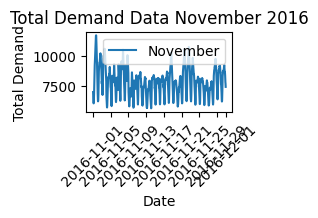

In [407]:
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2016')
plt.legend()
plt.xticks(rotation=45)

Plot data December

(array([17136., 17140., 17144., 17148., 17152., 17156., 17160., 17164.,
        17167.]),
 [Text(17136.0, 0, '2016-12-01'),
  Text(17140.0, 0, '2016-12-05'),
  Text(17144.0, 0, '2016-12-09'),
  Text(17148.0, 0, '2016-12-13'),
  Text(17152.0, 0, '2016-12-17'),
  Text(17156.0, 0, '2016-12-21'),
  Text(17160.0, 0, '2016-12-25'),
  Text(17164.0, 0, '2016-12-29'),
  Text(17167.0, 0, '2017-01-01')])

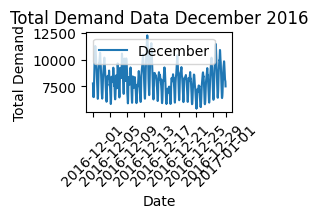

In [408]:
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2016')
plt.legend()
plt.xticks(rotation=45)

In [409]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

Convert DATETIME column to datetime type

In [410]:
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%d/%m/%Y %H:%M')

Data filter only for  January 2010

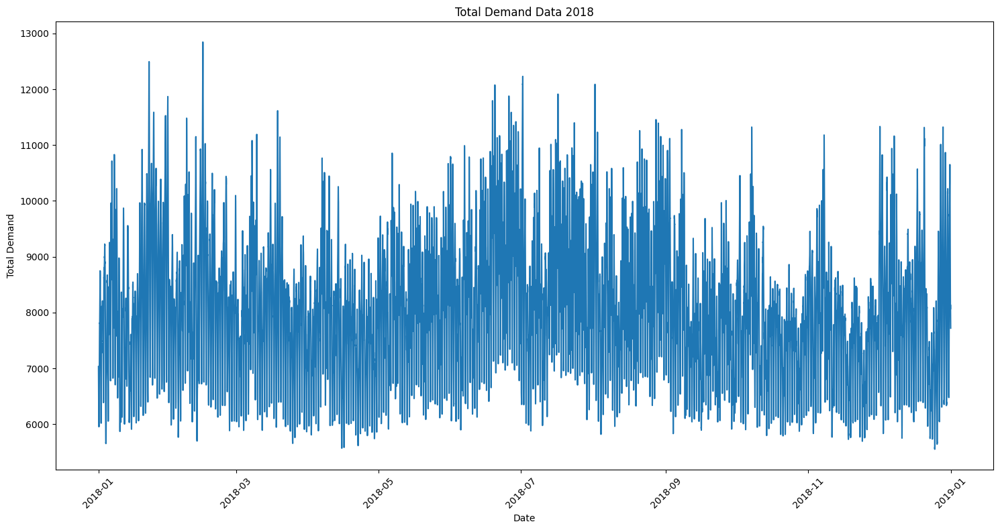

In [411]:
data_2018 = demand_clean[(demand_clean['DATETIME'].dt.year == 2018)]
data_2018 = data_2018.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2018['DATETIME'], data_2018['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data 2018')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

In [412]:
import matplotlib.pyplot as plt
import pandas as pd

Data filter only for  2018

In [413]:
data_2018 = demand_clean[demand_clean['DATETIME'].dt.year == 2018]

Separate data by month

In [414]:
january_data = data_2018[data_2018['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2018[data_2018['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2018[data_2018['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2018[data_2018['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2018[data_2018['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2018[data_2018['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2018[data_2018['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2018[data_2018['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2018[data_2018['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2018[data_2018['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2018[data_2018['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2018[data_2018['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

Create manual subplots

In [415]:
plt.figure(figsize=(20, 8))

<Figure size 2000x800 with 0 Axes>

<Figure size 2000x800 with 0 Axes>

Plot data January

(array([17532., 17536., 17540., 17544., 17548., 17552., 17556., 17560.,
        17563.]),
 [Text(17532.0, 0, '2018-01-01'),
  Text(17536.0, 0, '2018-01-05'),
  Text(17540.0, 0, '2018-01-09'),
  Text(17544.0, 0, '2018-01-13'),
  Text(17548.0, 0, '2018-01-17'),
  Text(17552.0, 0, '2018-01-21'),
  Text(17556.0, 0, '2018-01-25'),
  Text(17560.0, 0, '2018-01-29'),
  Text(17563.0, 0, '2018-02-01')])

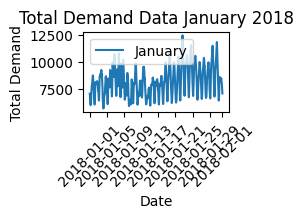

In [416]:
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data February

(array([17563., 17567., 17571., 17575., 17579., 17583., 17587., 17591.]),
 [Text(17563.0, 0, '2018-02-01'),
  Text(17567.0, 0, '2018-02-05'),
  Text(17571.0, 0, '2018-02-09'),
  Text(17575.0, 0, '2018-02-13'),
  Text(17579.0, 0, '2018-02-17'),
  Text(17583.0, 0, '2018-02-21'),
  Text(17587.0, 0, '2018-02-25'),
  Text(17591.0, 0, '2018-03-01')])

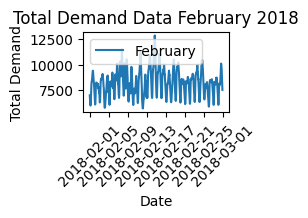

In [417]:
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data march

(array([17591., 17595., 17599., 17603., 17607., 17611., 17615., 17619.,
        17622.]),
 [Text(17591.0, 0, '2018-03-01'),
  Text(17595.0, 0, '2018-03-05'),
  Text(17599.0, 0, '2018-03-09'),
  Text(17603.0, 0, '2018-03-13'),
  Text(17607.0, 0, '2018-03-17'),
  Text(17611.0, 0, '2018-03-21'),
  Text(17615.0, 0, '2018-03-25'),
  Text(17619.0, 0, '2018-03-29'),
  Text(17622.0, 0, '2018-04-01')])

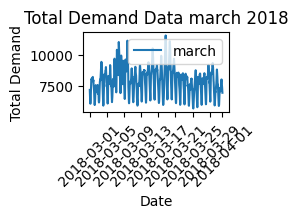

In [418]:
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data April

(array([17622., 17626., 17630., 17634., 17638., 17642., 17646., 17650.,
        17652.]),
 [Text(17622.0, 0, '2018-04-01'),
  Text(17626.0, 0, '2018-04-05'),
  Text(17630.0, 0, '2018-04-09'),
  Text(17634.0, 0, '2018-04-13'),
  Text(17638.0, 0, '2018-04-17'),
  Text(17642.0, 0, '2018-04-21'),
  Text(17646.0, 0, '2018-04-25'),
  Text(17650.0, 0, '2018-04-29'),
  Text(17652.0, 0, '2018-05-01')])

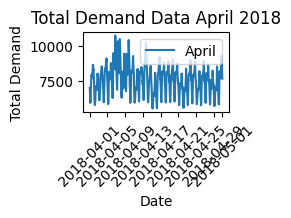

In [419]:
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data May

(array([17652., 17656., 17660., 17664., 17668., 17672., 17676., 17680.,
        17683.]),
 [Text(17652.0, 0, '2018-05-01'),
  Text(17656.0, 0, '2018-05-05'),
  Text(17660.0, 0, '2018-05-09'),
  Text(17664.0, 0, '2018-05-13'),
  Text(17668.0, 0, '2018-05-17'),
  Text(17672.0, 0, '2018-05-21'),
  Text(17676.0, 0, '2018-05-25'),
  Text(17680.0, 0, '2018-05-29'),
  Text(17683.0, 0, '2018-06-01')])

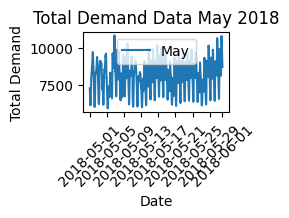

In [420]:
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data June

(array([17683., 17687., 17691., 17695., 17699., 17703., 17707., 17711.,
        17713.]),
 [Text(17683.0, 0, '2018-06-01'),
  Text(17687.0, 0, '2018-06-05'),
  Text(17691.0, 0, '2018-06-09'),
  Text(17695.0, 0, '2018-06-13'),
  Text(17699.0, 0, '2018-06-17'),
  Text(17703.0, 0, '2018-06-21'),
  Text(17707.0, 0, '2018-06-25'),
  Text(17711.0, 0, '2018-06-29'),
  Text(17713.0, 0, '2018-07-01')])

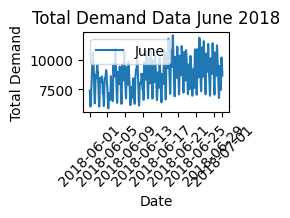

In [421]:
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data July

(array([17713., 17717., 17721., 17725., 17729., 17733., 17737., 17741.,
        17744.]),
 [Text(17713.0, 0, '2018-07-01'),
  Text(17717.0, 0, '2018-07-05'),
  Text(17721.0, 0, '2018-07-09'),
  Text(17725.0, 0, '2018-07-13'),
  Text(17729.0, 0, '2018-07-17'),
  Text(17733.0, 0, '2018-07-21'),
  Text(17737.0, 0, '2018-07-25'),
  Text(17741.0, 0, '2018-07-29'),
  Text(17744.0, 0, '2018-08-01')])

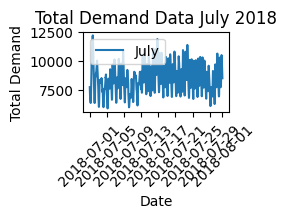

In [422]:
plt.subplot(4, 3, 7)  # 3  rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data August

(array([17744., 17748., 17752., 17756., 17760., 17764., 17768., 17772.,
        17775.]),
 [Text(17744.0, 0, '2018-08-01'),
  Text(17748.0, 0, '2018-08-05'),
  Text(17752.0, 0, '2018-08-09'),
  Text(17756.0, 0, '2018-08-13'),
  Text(17760.0, 0, '2018-08-17'),
  Text(17764.0, 0, '2018-08-21'),
  Text(17768.0, 0, '2018-08-25'),
  Text(17772.0, 0, '2018-08-29'),
  Text(17775.0, 0, '2018-09-01')])

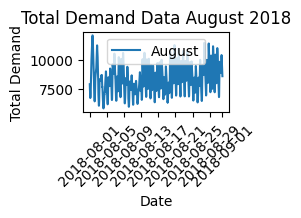

In [423]:
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data September

(array([17775., 17779., 17783., 17787., 17791., 17795., 17799., 17803.,
        17805.]),
 [Text(17775.0, 0, '2018-09-01'),
  Text(17779.0, 0, '2018-09-05'),
  Text(17783.0, 0, '2018-09-09'),
  Text(17787.0, 0, '2018-09-13'),
  Text(17791.0, 0, '2018-09-17'),
  Text(17795.0, 0, '2018-09-21'),
  Text(17799.0, 0, '2018-09-25'),
  Text(17803.0, 0, '2018-09-29'),
  Text(17805.0, 0, '2018-10-01')])

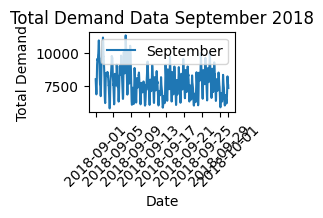

In [424]:
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data October

(array([17805., 17809., 17813., 17817., 17821., 17825., 17829., 17833.,
        17836.]),
 [Text(17805.0, 0, '2018-10-01'),
  Text(17809.0, 0, '2018-10-05'),
  Text(17813.0, 0, '2018-10-09'),
  Text(17817.0, 0, '2018-10-13'),
  Text(17821.0, 0, '2018-10-17'),
  Text(17825.0, 0, '2018-10-21'),
  Text(17829.0, 0, '2018-10-25'),
  Text(17833.0, 0, '2018-10-29'),
  Text(17836.0, 0, '2018-11-01')])

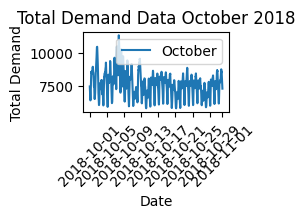

In [425]:
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data November

(array([17836., 17840., 17844., 17848., 17852., 17856., 17860., 17864.,
        17866.]),
 [Text(17836.0, 0, '2018-11-01'),
  Text(17840.0, 0, '2018-11-05'),
  Text(17844.0, 0, '2018-11-09'),
  Text(17848.0, 0, '2018-11-13'),
  Text(17852.0, 0, '2018-11-17'),
  Text(17856.0, 0, '2018-11-21'),
  Text(17860.0, 0, '2018-11-25'),
  Text(17864.0, 0, '2018-11-29'),
  Text(17866.0, 0, '2018-12-01')])

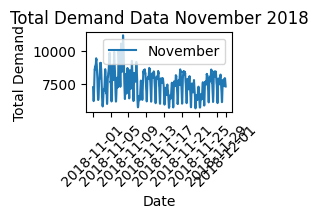

In [426]:
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2018')
plt.legend()
plt.xticks(rotation=45)

Plot data December

(array([17866., 17870., 17874., 17878., 17882., 17886., 17890., 17894.,
        17897.]),
 [Text(17866.0, 0, '2018-12-01'),
  Text(17870.0, 0, '2018-12-05'),
  Text(17874.0, 0, '2018-12-09'),
  Text(17878.0, 0, '2018-12-13'),
  Text(17882.0, 0, '2018-12-17'),
  Text(17886.0, 0, '2018-12-21'),
  Text(17890.0, 0, '2018-12-25'),
  Text(17894.0, 0, '2018-12-29'),
  Text(17897.0, 0, '2019-01-01')])

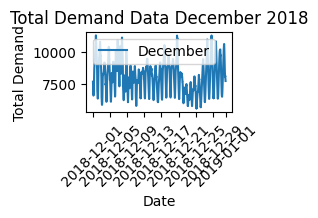

In [427]:
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2018')
plt.legend()
plt.xticks(rotation=45)

In [428]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

Convert DATETIME column to datetime type

In [429]:
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%d/%m/%Y %H:%M')

Data filter only for January 2010

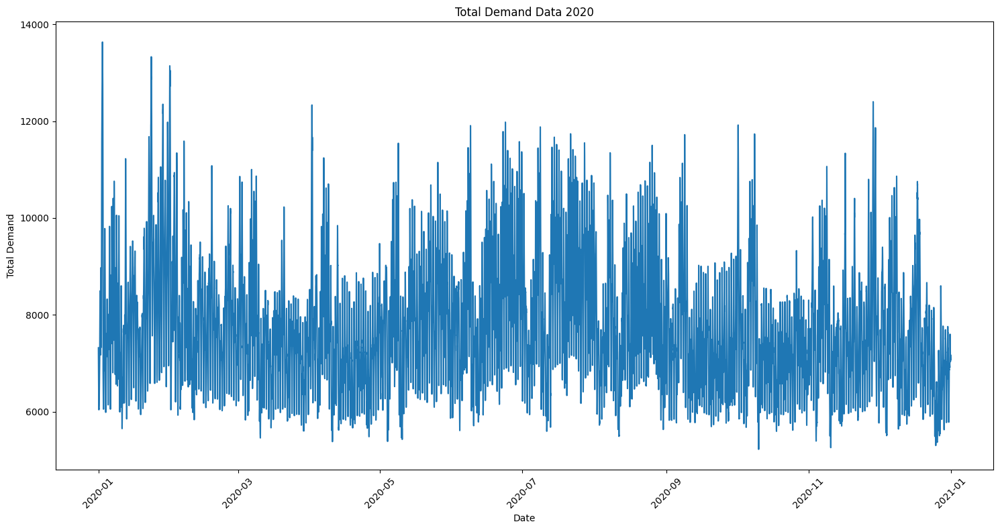

In [430]:
data_2020 = demand_clean[(demand_clean['DATETIME'].dt.year == 2020)]
data_2020 = data_2020.sort_values(by='DATETIME')
# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2020['DATETIME'], data_2020['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data 2020')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

In [431]:
import matplotlib.pyplot as plt
import pandas as pd

Data filter only for 2020

In [432]:
data_2020 = demand_clean[demand_clean['DATETIME'].dt.year == 2020]

Separate data by month

In [433]:
january_data = data_2020[data_2020['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2020[data_2020['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2020[data_2020['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2020[data_2020['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2020[data_2020['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2020[data_2020['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2020[data_2020['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2020[data_2020['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2020[data_2020['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2020[data_2020['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2020[data_2020['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2020[data_2020['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

Create manual subplots

In [434]:
plt.figure(figsize=(20, 8))

<Figure size 2000x800 with 0 Axes>

<Figure size 2000x800 with 0 Axes>

January data Plot

(array([18262., 18266., 18270., 18274., 18278., 18282., 18286., 18290.,
        18293.]),
 [Text(18262.0, 0, '2020-01-01'),
  Text(18266.0, 0, '2020-01-05'),
  Text(18270.0, 0, '2020-01-09'),
  Text(18274.0, 0, '2020-01-13'),
  Text(18278.0, 0, '2020-01-17'),
  Text(18282.0, 0, '2020-01-21'),
  Text(18286.0, 0, '2020-01-25'),
  Text(18290.0, 0, '2020-01-29'),
  Text(18293.0, 0, '2020-02-01')])

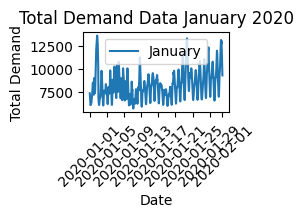

In [435]:
plt.subplot(4, 3, 1)  # 3  rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2020')
plt.legend()
plt.xticks(rotation=45)

February data Plot

(array([18293., 18297., 18301., 18305., 18309., 18313., 18317., 18321.,
        18322.]),
 [Text(18293.0, 0, '2020-02-01'),
  Text(18297.0, 0, '2020-02-05'),
  Text(18301.0, 0, '2020-02-09'),
  Text(18305.0, 0, '2020-02-13'),
  Text(18309.0, 0, '2020-02-17'),
  Text(18313.0, 0, '2020-02-21'),
  Text(18317.0, 0, '2020-02-25'),
  Text(18321.0, 0, '2020-02-29'),
  Text(18322.0, 0, '2020-03-01')])

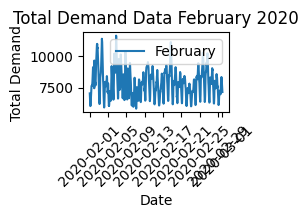

In [436]:
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2020')
plt.legend()
plt.xticks(rotation=45)

March data Plot

(array([18321., 18322., 18326., 18330., 18334., 18338., 18342., 18346.,
        18350., 18353.]),
 [Text(18321.0, 0, '2020-02-29'),
  Text(18322.0, 0, '2020-03-01'),
  Text(18326.0, 0, '2020-03-05'),
  Text(18330.0, 0, '2020-03-09'),
  Text(18334.0, 0, '2020-03-13'),
  Text(18338.0, 0, '2020-03-17'),
  Text(18342.0, 0, '2020-03-21'),
  Text(18346.0, 0, '2020-03-25'),
  Text(18350.0, 0, '2020-03-29'),
  Text(18353.0, 0, '2020-04-01')])

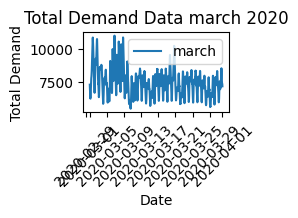

In [437]:
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2020')
plt.legend()
plt.xticks(rotation=45)

April data Plot

(array([18353., 18357., 18361., 18365., 18369., 18373., 18377., 18381.,
        18383.]),
 [Text(18353.0, 0, '2020-04-01'),
  Text(18357.0, 0, '2020-04-05'),
  Text(18361.0, 0, '2020-04-09'),
  Text(18365.0, 0, '2020-04-13'),
  Text(18369.0, 0, '2020-04-17'),
  Text(18373.0, 0, '2020-04-21'),
  Text(18377.0, 0, '2020-04-25'),
  Text(18381.0, 0, '2020-04-29'),
  Text(18383.0, 0, '2020-05-01')])

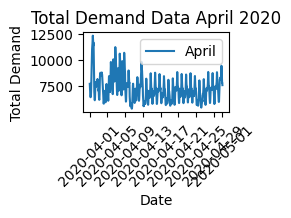

In [438]:
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2020')
plt.legend()
plt.xticks(rotation=45)

May data Plot

(array([18383., 18387., 18391., 18395., 18399., 18403., 18407., 18411.,
        18414.]),
 [Text(18383.0, 0, '2020-05-01'),
  Text(18387.0, 0, '2020-05-05'),
  Text(18391.0, 0, '2020-05-09'),
  Text(18395.0, 0, '2020-05-13'),
  Text(18399.0, 0, '2020-05-17'),
  Text(18403.0, 0, '2020-05-21'),
  Text(18407.0, 0, '2020-05-25'),
  Text(18411.0, 0, '2020-05-29'),
  Text(18414.0, 0, '2020-06-01')])

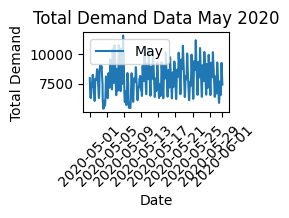

In [439]:
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2020')
plt.legend()
plt.xticks(rotation=45)

June data Plot

(array([18414., 18418., 18422., 18426., 18430., 18434., 18438., 18442.,
        18444.]),
 [Text(18414.0, 0, '2020-06-01'),
  Text(18418.0, 0, '2020-06-05'),
  Text(18422.0, 0, '2020-06-09'),
  Text(18426.0, 0, '2020-06-13'),
  Text(18430.0, 0, '2020-06-17'),
  Text(18434.0, 0, '2020-06-21'),
  Text(18438.0, 0, '2020-06-25'),
  Text(18442.0, 0, '2020-06-29'),
  Text(18444.0, 0, '2020-07-01')])

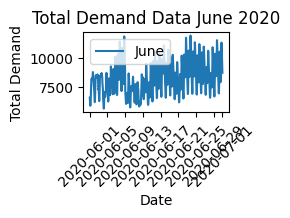

In [440]:
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2020')
plt.legend()
plt.xticks(rotation=45)

July data Plot

(array([18444., 18448., 18452., 18456., 18460., 18464., 18468., 18472.,
        18475.]),
 [Text(18444.0, 0, '2020-07-01'),
  Text(18448.0, 0, '2020-07-05'),
  Text(18452.0, 0, '2020-07-09'),
  Text(18456.0, 0, '2020-07-13'),
  Text(18460.0, 0, '2020-07-17'),
  Text(18464.0, 0, '2020-07-21'),
  Text(18468.0, 0, '2020-07-25'),
  Text(18472.0, 0, '2020-07-29'),
  Text(18475.0, 0, '2020-08-01')])

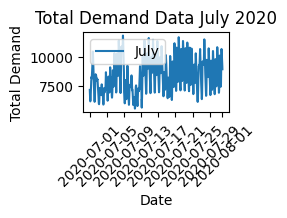

In [441]:
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2020')
plt.legend()
plt.xticks(rotation=45)

August data Plot

(array([18475., 18479., 18483., 18487., 18491., 18495., 18499., 18503.,
        18506.]),
 [Text(18475.0, 0, '2020-08-01'),
  Text(18479.0, 0, '2020-08-05'),
  Text(18483.0, 0, '2020-08-09'),
  Text(18487.0, 0, '2020-08-13'),
  Text(18491.0, 0, '2020-08-17'),
  Text(18495.0, 0, '2020-08-21'),
  Text(18499.0, 0, '2020-08-25'),
  Text(18503.0, 0, '2020-08-29'),
  Text(18506.0, 0, '2020-09-01')])

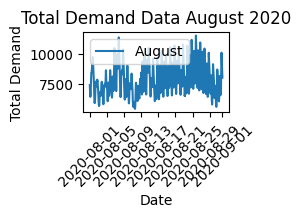

In [442]:
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2020')
plt.legend()
plt.xticks(rotation=45)

September data Plot

(array([18506., 18510., 18514., 18518., 18522., 18526., 18530., 18534.,
        18536.]),
 [Text(18506.0, 0, '2020-09-01'),
  Text(18510.0, 0, '2020-09-05'),
  Text(18514.0, 0, '2020-09-09'),
  Text(18518.0, 0, '2020-09-13'),
  Text(18522.0, 0, '2020-09-17'),
  Text(18526.0, 0, '2020-09-21'),
  Text(18530.0, 0, '2020-09-25'),
  Text(18534.0, 0, '2020-09-29'),
  Text(18536.0, 0, '2020-10-01')])

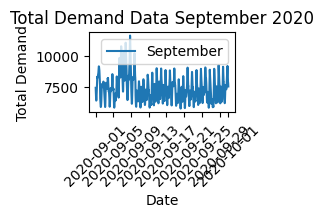

In [443]:
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2020')
plt.legend()
plt.xticks(rotation=45)

October data Plot

(array([18536., 18540., 18544., 18548., 18552., 18556., 18560., 18564.,
        18567.]),
 [Text(18536.0, 0, '2020-10-01'),
  Text(18540.0, 0, '2020-10-05'),
  Text(18544.0, 0, '2020-10-09'),
  Text(18548.0, 0, '2020-10-13'),
  Text(18552.0, 0, '2020-10-17'),
  Text(18556.0, 0, '2020-10-21'),
  Text(18560.0, 0, '2020-10-25'),
  Text(18564.0, 0, '2020-10-29'),
  Text(18567.0, 0, '2020-11-01')])

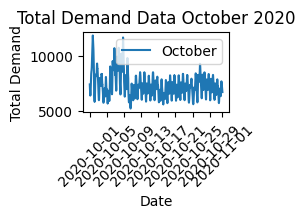

In [444]:
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2020')
plt.legend()
plt.xticks(rotation=45)

November data Plot

(array([18567., 18571., 18575., 18579., 18583., 18587., 18591., 18595.,
        18597.]),
 [Text(18567.0, 0, '2020-11-01'),
  Text(18571.0, 0, '2020-11-05'),
  Text(18575.0, 0, '2020-11-09'),
  Text(18579.0, 0, '2020-11-13'),
  Text(18583.0, 0, '2020-11-17'),
  Text(18587.0, 0, '2020-11-21'),
  Text(18591.0, 0, '2020-11-25'),
  Text(18595.0, 0, '2020-11-29'),
  Text(18597.0, 0, '2020-12-01')])

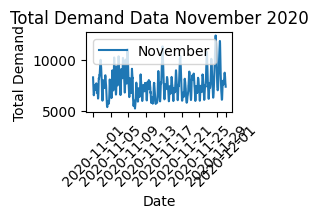

In [445]:
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2020')
plt.legend()
plt.xticks(rotation=45)

December data Plot

(array([18597., 18601., 18605., 18609., 18613., 18617., 18621., 18625.,
        18628.]),
 [Text(18597.0, 0, '2020-12-01'),
  Text(18601.0, 0, '2020-12-05'),
  Text(18605.0, 0, '2020-12-09'),
  Text(18609.0, 0, '2020-12-13'),
  Text(18613.0, 0, '2020-12-17'),
  Text(18617.0, 0, '2020-12-21'),
  Text(18621.0, 0, '2020-12-25'),
  Text(18625.0, 0, '2020-12-29'),
  Text(18628.0, 0, '2021-01-01')])

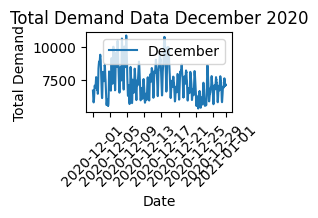

In [446]:
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2020')
plt.legend()
plt.xticks(rotation=45)

In [447]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

Merge both DataFrames based on key column 'key'

In [448]:
data_fix = pd.merge(temp_clean, demand_clean, on='DATETIME', how='inner')
data_fix = data_fix.drop(columns=['LOCATION','REGIONID'])
data_fix

,DATETIME,TEMPERATURE,TOTALDEMAND
0,2010-01-01 00:00:00,23.1,8038.00
1,2010-01-01 00:30:00,22.9,7809.31
2,2010-01-01 01:00:00,22.6,7483.69
3,2010-01-01 01:30:00,22.5,7117.23
4,2010-01-01 02:00:00,22.5,6812.03
...,...,...,...
195929,2021-03-17 22:00:00,19.7,7419.77
195930,2021-03-17 22:30:00,19.5,7417.91
195931,2021-03-17 23:00:00,19.1,7287.32
195932,2021-03-17 23:30:00,18.8,7172.39


## ACF and PACF Temperature

In [450]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

ACF plot

<Figure size 1000x600 with 0 Axes>

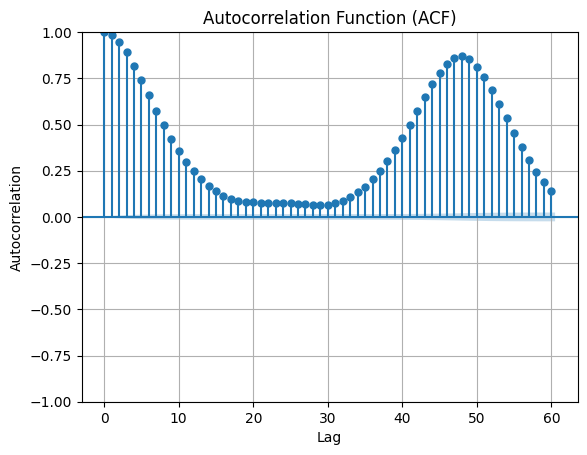

In [451]:
plt.figure(figsize=(10, 6))
plot_acf(data_fix['TOTALDEMAND'], lags=60)  # Change the number of lags as needed
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.grid(True)
plt.show()

PACF Plot

<Figure size 1000x600 with 0 Axes>

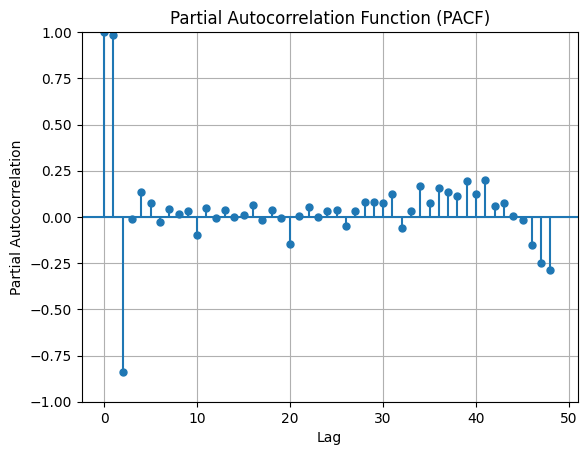

In [452]:
plt.figure(figsize=(10, 6))
plot_pacf(data_fix['TOTALDEMAND'], lags=48)  #
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.grid(True)
plt.show()


### Data Sharing




In [457]:
train_data = data_fix.iloc[:int(0.8*len(data_fix))]
test_data = data_fix.iloc[int(0.8*len(data_fix)):]
test_data

,DATETIME,TEMPERATURE,TOTALDEMAND
156747,2018-12-22 13:30:00,19.7,6716.33
156748,2018-12-22 14:00:00,19.7,6722.00
156749,2018-12-22 14:30:00,20.0,6714.45
156750,2018-12-22 15:00:00,20.2,6769.31
156751,2018-12-22 15:30:00,20.7,6846.47
...,...,...,...
195929,2021-03-17 22:00:00,19.7,7419.77
195930,2021-03-17 22:30:00,19.5,7417.91
195931,2021-03-17 23:00:00,19.1,7287.32
195932,2021-03-17 23:30:00,18.8,7172.39



## ARIMA Modeling

In [453]:
!pip3 install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 13.5 MB/s eta 0:00:00


In [454]:
import pmdarima as pm

Fit the seasonal ARIMA model using auto_arima

In [459]:
model_ARIMA = pm.auto_arima(train_data['TOTALDEMAND'], X=train_data.drop(columns=['DATETIME','TOTALDEMAND']),error_action='ignore', trace=True,
                      suppress_warnings=True, maxiter=500,test='adf')

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=180.49 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2688054.430, Time=37.64 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2134904.867, Time=80.07 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2482089.958, Time=134.12 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4643997.255, Time=3.35 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1947732.797, Time=234.40 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2035689.953, Time=123.47 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=391.11 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=92.91 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 1702.403 seconds


Print out summary information on the fit

In [460]:
print(model_ARIMA.summary())
print(model_ARIMA.params())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:               156747
Model:               SARIMAX(2, 0, 0)   Log Likelihood             -973861.399
Date:                Thu, 28 Mar 2024   AIC                        1947732.797
Time:                        06:51:25   BIC                        1947782.609
Sample:                             0   HQIC                       1947747.615
                             - 156747                                         
Covariance Type:                  opg                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
intercept     220.4356      2.041    108.001      0.000     216.435     224.436
TEMPERATURE    -2.1697      0.325     -6.683      0.000      -2.806      -1.533
ar.L1           1.8113      0.001   1870.783    

Summarize the model

In [461]:
print(model_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:               156747
Model:               SARIMAX(2, 0, 0)   Log Likelihood             -973861.399
Date:                Thu, 28 Mar 2024   AIC                        1947732.797
Time:                        06:51:33   BIC                        1947782.609
Sample:                             0   HQIC                       1947747.615
                             - 156747                                         
Covariance Type:                  opg                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
intercept     220.4356      2.041    108.001      0.000     216.435     224.436
TEMPERATURE    -2.1697      0.325     -6.683      0.000      -2.806      -1.533
ar.L1           1.8113      0.001   1870.783    


Obtained by using auto arima, the optimal AIC is in Model AR 2 (2,0,0). This model produces each coefficient as significant, indicated by a P-Value smaller than alpha (0.05). However, the assumptions of ARIMA in this model, including Non-Autocorrelation, Normality, and Homoscedasticity are not met.
If written in this model equation it becomes
Yhat = 220.43 - 2.17(Temperature) + 1.81(Phi1) - 0.83(Phi2) + 1.459e+04
#### Evaluation of the ARIMA Model with MAPE MSE, and RMSE


In [462]:
predictions=model_ARIMA.predict(n_periods=len(test_data), X=test_data.drop(columns=['DATETIME','TOTALDEMAND']), alpha=0.05)

In [463]:
mape=mean_absolute_percentage_error(test_data['TOTALDEMAND'], predictions)*100
print("Mean Absolute Percentage Error : %.2f%%"  % (mape))

Mean Absolute Percentage Error : 14.37%


rint('MAPE Test (3 Layer): %.2f%%' % (mape_test_bigru3layer))

In [464]:
mse=mean_squared_error(test_data['TOTALDEMAND'], predictions)
print("Mean Squared Error : %.2f" % (mse))

Mean Squared Error : 1719722.44


In [465]:
print("Root Mean Squared Error : %.2f"% ((mse)**0.5))

Root Mean Squared Error : 1311.38


In [469]:
prediction=pd.DataFrame(predictions)
prediction=prediction.reset_index()
prediction=prediction.drop(columns='index')
prediction

,0
0,6806.982647
1,6882.129492
2,6979.331237
3,7093.157288
4,7217.021453
...,...
39182,8183.529502
39183,8183.963436
39184,8184.831303
39185,8185.482203


In [472]:

output=pd.DataFrame()
output['Data Actual (Testing)']=test_data['TOTALDEMAND']
output['Prediction']=prediction[0]
output['Difference/Error']=output['Data Actual (Testing)']-output['Prediction']
output['% Change']=abs(output['Difference/Error']/output['Data Actual (Testing)'])*100
output['% Change'] = output['% Change'].apply(lambda x: f'{x:.2f}%')
output = output.round(2)
output

,Data Actual (Testing),Prediction,Difference/Error,% Change
156747,6716.33,NaN,NaN,nan%
156748,6722.00,NaN,NaN,nan%
156749,6714.45,NaN,NaN,nan%
156750,6769.31,NaN,NaN,nan%
156751,6846.47,NaN,NaN,nan%
...,...,...,...,...
195929,7419.77,NaN,NaN,nan%
195930,7417.91,NaN,NaN,nan%
195931,7287.32,NaN,NaN,nan%
195932,7172.39,NaN,NaN,nan%
